In [ ]:
import os
import time
import traceback
import requests
import shutil
import zipfile
import csv
import numpy as np
import pandas as pd
import requests
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
pd.set_option("display.max_columns", None)

# Stooq.com data extraction

In [ ]:
macro_series = {
    "US": [
        "GDPQUS.M", "GDPYUS.M",
        "INPMUS.M", "INPYUS.M",
        "RSAMUS.M", "RSAYUS.M", "RSLMUS.M", "RSLYUS.M",
        "CPUMUS.M",
        "UNRTUS.M",
        "NFPMUS.M",
        "INJCUS.M",
        "CPIMUS.M", "CPIYUS.M",
        "CPCMUS.M", "CPCYUS.M",
        "PPIMUS.M", "PPIYUS.M",
        "10YUSY.B", "2YUSY.B",
        "EXPMUS.M", "EXPRUS.M", "EXPYUS.M",
        "TRBNUS.M",
        "CRABUS.M",
        "PMCHUS.M",
        "CNCRUS.M",
        "LDIIUS.M"
    ],
    "CA": [
        "GDPQCA.M", "GDPMCA.M",
        "IPPMCA.M", "IPPYCA.M",
        "RSAMCA.M", "RSAYCA.M", "RSLMCA.M", "RSLYCA.M",
        "CPURCA.M",
        "UNRTCA.M",
        "NFPMCA.M",
        "CPIMCA.M", "CPIYCA.M",
        "CPCMCA.M", "CPCYCA.M",
        "INRTCA.M",
        "10YCAY.B", "2YCAY.B",
        "EXPRCA.M",
        "CRABCA.M",
        "IVPMCA.M"
    ],
    "UK": [
        "GDPQUK.M",
        "INPMUK.M", "INPYUK.M",
        "RSAMUK.M", "RSAYUK.M", "RSLMUK.M", "RSLYUK.M",
        "UNRTUK.M",
        "CPIMUK.M", "CPIYUK.M",
        "CPCYUK.M",
        "PPIMUK.M", "PPIYUK.M", "PPNMUK.M", "PPNYUK.M",
        "INRTUK.M",
        "10YUKY.B", "2YUKY.B",
        "M4SMUK.M", "M4SYUK.M",
        "EXPRUK.M",
        "TRBNUK.M",
        "CRABUK.M",
        "PMMNUK.M", "PMSRUK.M"
    ],
    "EU": [
        "GDPQEU.M", "GDPYEU.M",
        "INPMEU.M", "INPYEU.M",
        "RSAMEU.M", "RSAYEU.M",
        "UNRTEU.M",
        "CPIMEU.M", "CPIYEU.M",
        "CPCYEU.M",
        "PPIMEU.M", "PPIYEU.M",
        "INRTEU.M",
        "10YDEY.B", "2YDEY.B",
        "M3SYEU.M",
        "EXPREU.M",
        "TRBNEU.M",
        "CRABEU.M",
        "PMMNEU.M", "PMSREU.M",
        "CNCIEU.M"
    ],
    "CN": [
        "GDPYCN.M",
        "INPYCN.M",
        "RSAYCN.M",
        "CPIYCN.M",
        "PPIYCN.M",
        "10YCNY.B",
        "EXPRCN.M",
        "TRBNCN.M",
        "PMMNCN.M", "PMSRCN.M"
    ],
    "JP": [
        "GDPQJP.M", "GDPYJP.M",
        "INPMJP.M", "INPYJP.M",
        "RTTYJP.M",
        "UNRTJP.M",
        "CPCYJP.M",
        "PPIYJP.M",
        "INRTJP.M",
        "10YJPY.B", "2YJPY.B",
        "M3SYJP.M",
        "EXPRJP.M",
        "TRBNJP.M",
        "CRABJP.M",
        "PMMNJP.M", "PMSRJP.M",
        "CNCIJP.M",
        "LDIIJP.M"
    ],
    "KR": [
        "10YKRY.B", "2YKRY.B"
    ],
    "ID": [
        "10YIDY.B"
    ],
    "IN": [
        "10YINY.B", "2YINY.B", "3MINY.B"
    ],
    "ZA": [
        "10YZAY.B"
    ],
    "AU": [
        "GDPQAU.M", "GDPYAU.M",
        "RSAMAU.M",
        "UNRTAU.M",
        "CPIQAU.M", "CPIYAU.M",
        "PPIQAU.M", "PPIYAU.M",
        "INRTAU.M",
        "10YAUY.B", "2YAUY.B",
        "M3SMAU.M", "M3SYAU.M",
        "EXPRAU.M",
        "TRBNAU.M",
        "CRABAU.M",
        "BSCNAU.M"
    ],
    "NZ": [
        "10YNZY.B"
    ],
    "BR": [
        "10YBRY.B", "2YBRY.B"
    ]
}

In [ ]:
def extract_macro_variables_stooq(macro_variable_series):
    base_location = os.getcwd()
    temp_directory = os.path.join(base_location, 'tmp')
    os.makedirs(temp_directory, exist_ok=True)

    region_dataframes = {region: pd.DataFrame() for region in macro_variable_series}

    all_zip_files = [f for f in os.listdir(base_location) if f.endswith(('_macro_txt.zip', '_world_txt.zip'))]

    for zip_file in all_zip_files:
        with zipfile.ZipFile(os.path.join(base_location, zip_file), "r") as z:
            for item in z.infolist():
                if item.filename.endswith('.txt'):
                    filepath = z.extract(item, path=temp_directory)
                    filepath_lower = filepath.lower()

                    for region, series_list in macro_variable_series.items():
                        for symbol in series_list:
                            symbol_lower = symbol.lower()
                            if symbol_lower in filepath_lower:
                                try:
                                    df = pd.read_csv(filepath)
                                    if "<DATE>" in df.columns and "<CLOSE>" in df.columns:
                                        df = df[["<DATE>", "<CLOSE>"]].rename(columns={
                                            "<DATE>": "date",
                                            "<CLOSE>": symbol
                                        })
                                        df["date"] = pd.to_datetime(df["date"], format="%Y%m%d")
                                        df.set_index("date", inplace=True)
                                        if region_dataframes[region].empty:
                                            region_dataframes[region] = df
                                        else:
                                            region_dataframes[region] = region_dataframes[region].join(df, how="outer")
                                except Exception as e:
                                    print(f"Failed to process {symbol} for region {region}: {e}")

    # For each region's dataframe:
    # Forward-fill missing values column-wise
    # Drop rows where all columns remain missing
    for region, df in region_dataframes.items():
        if not df.empty:
            df.ffill(inplace=True)
            df.dropna(how='all', inplace=True)

    shutil.rmtree(temp_directory, ignore_errors=True)
    return region_dataframes

In [ ]:
region_dfs = extract_macro_variables_stooq(macro_series)

In [ ]:
region_dfs["IN"].loc["1997-11-01":].head()

,10YINY.B,2YINY.B,3MINY.B
date,,,
1998-03-27,12.086,NaN,NaN
1998-03-30,12.104,NaN,NaN
1998-03-31,12.086,NaN,NaN
1998-04-02,12.077,NaN,NaN
1998-04-03,11.891,NaN,NaN


# OECD data extraction

In [ ]:
eu_members_list = [
    'AUT', 'BEL', 'BGR', 'HRV', 'CZE', 'DNK', 'EST', 'FIN', 'CYP',
    'FRA', 'DEU', 'GRC', 'HUN', 'IRL', 'ITA', 'LVA', 'LTU', 'MLT',
    'LUX', 'NLD', 'POL', 'PRT', 'ROU', 'SVK', 'SVN', 'ESP', 'SWE'
]

oecd_country_names = {
    "AUS": "Australia", "AUT": "Austria", "BEL": "Belgium", "BGR": "Bulgaria",
    "BRA": "Brazil", "CAN": "Canada", "CHE": "Switzerland", "CHL": "Chile",
    "CHN": "China", "COL": "Colombia", "CRI": "Costa Rica", "CZE": "Czech Republic",
    "DEU": "Germany", "DNK": "Denmark", "ESP": "Spain", "EST": "Estonia", "FIN": "Finland", "FRA": "France",
    "GBR": "United Kingdom", "GRC": "Greece", "HUN": "Hungary", "HRV": "Croatia",
    "IDN": "Indonesia", "IND": "India", "IRL": "Ireland", "ISL": "Iceland",
    "ISR": "Israel", "ITA": "Italy", "JPN": "Japan", "KOR": "South Korea",
    "LTU": "Lithuania", "LUX": "Luxembourg", "LVA": "Latvia", "MEX": "Mexico",
    "NLD": "Netherlands", "NOR": "Norway", "NZL": "New Zealand", "POL": "Poland",
    "PRT": "Portugal", "ROU": "Romania", "RUS": "Russia", "SVK": "Slovakia",
    "SVN": "Slovenia", "SWE": "Sweden", "TUR": "Turkey", "USA": "United States",
    "ZAF": "South Africa", "OECD": "OECD Countries",
    "EU27_2020": "European Union", "EA": "Euro Area", "EA11": "Euro Area 11",
    "EA17": "Euro Area 17", "EA18": "Euro Area 18", "EA19": "Euro Area 19",
    "EA20": "Euro Area 20", "EU": "European Union All", "EU15": "European Union 15",
    "G4E": "Major four European Countries"
}

# ----------------------------
# OECD METADATA DEFINITIONS
# ----------------------------
oecd_macro_definitions = {
    "GDP_QOQ": {
        "dataflow": "OECD.SDD.NAD,DSD_NAMAIN1@DF_QNA_EXPENDITURE_GROWTH_G20,1.1",
        # Real GDP growth rate (volume, seasonally adjusted, YOY % change)
        # Need to filter sub regions of a country under REF_AREA
        "key": "Q............",
        "frequency": "Q",
        "datafilters": {"TRANSACTION": "B1GQ", "SECTOR": "S1", "TRANSFORMATION": "G1"}
    },
    "GDP_YOY": {
        "dataflow": "OECD.SDD.NAD,DSD_NAMAIN1@DF_QNA_EXPENDITURE_GROWTH_G20,1.1",
        # Real GDP growth rate (volume, seasonally adjusted, YOY % change)
        # Need to filter sub regions of a country under REF_AREA
        # GDP_Composite = 0.6 * QoQ + 0.4 * YoY
        "key": "Q............",
        "frequency": "Q",
        "datafilters": {"TRANSACTION": "B1GQ", "SECTOR": "S1", "TRANSFORMATION": "GY"}
    },
    "IND_PRD_IDX": {
        "dataflow": "OECD.SDD.STES,DSD_KEI@DF_KEI,4.0",
        # Industrial production, total industry excl. construction (2015=100, SA, monthly)
        "key": "...IX.BTE..",
        "frequency": "M"
    },
    "RET_TRD_VOL_IDX": {
        "dataflow": "OECD.SDD.STES,DSD_STES@DF_INDSERV,4.2",
        # Retail trade volume, total (2015=100, SA, monthly)
        # "MEASURE" == "TOVM"
        "key": ".M.......",
        "frequency": "M",
        "datafilters": {"MEASURE": "TOVM"}
    },
    "UNEMP_RATE": {
        "dataflow": "OECD.SDD.TPS,DSD_LFS@DF_IALFS_UNE_M,1.0",
        # Harmonised unemployment rate (percentage of labor force, ages 15+, SA)
        "key": "..PT_LF_SUB._Z.Y._T.Y_GE15..M",
        "frequency": "M"
    },
    "PARTICPN_RATE": {
        "dataflow": "OECD.SDD.TPS,DSD_LFS@DF_IALFS_LF_WAP_Q,1.0",
        # Labour force participation rate, % of working age population, SA
        "key": ".LF_WAP.._Z.Y._T.Y15T64..Q",
        "frequency": "Q"
    },
    "CPI_ALL": {
        "dataflow": "OECD.SDD.TPS,DSD_PRICES@DF_PRICES_ALL,1.0",
        # Consumer Price Index, all items (2015=100, NSA, monthly)
        "key": ".M.N.CPI...N.GY+_Z",
        "frequency": "M",
        "datafilters": {"EXPENDITURE": "_T"}
    },
    "CPI_CORE": {
        "dataflow": "OECD.SDD.TPS,DSD_PRICES@DF_PRICES_ALL,1.0",
        # Consumer Price Index, all items (2015=100, NSA, monthly)
        "key": ".M.N.CPI...N.GY+_Z",
        "frequency": "M",
        "datafilters": {"EXPENDITURE": "_TXCP01_NRG"}
    },
    "3M_INTR_RATE": {
        "dataflow": "OECD.SDD.STES,DSD_STES@DF_FINMARK,4.0",
        # 3-month interbank rate (percent per annum, NSA, monthly)
        # Does not contain EU
        "key": ".M..PA.....",
        "frequency": "M",
        "datafilters": {"MEASURE": "IR3TIB"}
    },
    "10Y_INTR_RATE": {
        "dataflow": "OECD.SDD.STES,DSD_STES@DF_FINMARK,4.0",
        # 10-year government bond yield (percent per annum, NSA, monthly)
        # Does not contain EU
        "key": ".M..PA.....",
        "frequency": "M",
        "datafilters": {"MEASURE": "IRLT"}
    },
    "CCI": {
        "dataflow": "OECD.SDD.STES,DSD_STES@DF_CLI,4.1",
        # Composite consumer confidence index, normalized growth
        "key": ".M....AA...H",
        "frequency": "M",
        "datafilters": {"MEASURE": "CCICP", "ACTIVITY": "_Z"}
    },
    "BCI": {
        "dataflow": "OECD.SDD.STES,DSD_STES@DF_CLI,4.1",
        # Composite Business Confidence index
        "key": ".M....AA...H",
        "frequency": "M",
        "datafilters": {"MEASURE": "BCICP", "ACTIVITY": "_Z"}
    },
    "TRD_BAL_GODS": {
        "dataflow": "OECD.SDD.TPS,DSD_BOP@DF_BOP,1.0",
        # Trade Balance Goods = ("ACCOUNTING_ENTRY" = "B" and "MEASURE" = "G")
        "key": ".....Q.XDC.Y",
        "frequency": "Q",
        "datafilters": {"ACCOUNTING_ENTRY": "B", "MEASURE": "G"}
    },
    "TRD_BAL_SERV": {
        "dataflow": "OECD.SDD.TPS,DSD_BOP@DF_BOP,1.0",
        # Trade Balance Services = ("ACCOUNTING_ENTRY" = "B" and "MEASURE" = "S")
        "key": ".....Q.XDC.Y",
        "frequency": "Q",
        "datafilters": {"ACCOUNTING_ENTRY": "B", "MEASURE": "S"}
    },
    "CUR_ACCT_BAL": {
        "dataflow": "OECD.SDD.TPS,DSD_BOP@DF_BOP,1.0",
        # Current Account Balance = ("ACCOUNTING_ENTRY" = "B" and "MEASURE" = "CA")
        "key": ".....Q.XDC.Y",
        "frequency": "Q",
        "datafilters": {"ACCOUNTING_ENTRY": "B", "MEASURE": "CA"}
    },
    "CLI": {
        "dataflow": "OECD.SDD.STES,DSD_STES@DF_CLI,4.1",
        # Composite Leading Indicator (amplitude adjusted, index, SA, monthly)
        "key": ".M....AA...H",
        "frequency": "M",
        "datafilters": {"MEASURE": "LI", "ACTIVITY": "_Z"}
    },
}

In [ ]:
# ----------------------------
# OECD FETCH FUNCTION
# ----------------------------
def fetch_oecd_timeseries(dataflow, key, start_period=None):
    """
    Fetches OECD timeseries data from the SDMX API.

    Parameters:
    - dataflow (str): Structure is "AGENCY,DATASET_ID,VERSION"
        Example: "OECD.SDD.TPS,DSD_LFS@DF_IALFS_EMP_WAP_Q,1.0"
        - OECD.SDD.TPS = OECD agency
        - DSD_LFS@DF_IALFS_EMP_WAP_Q = Dataset ID (with DSD reference)
        - 1.0 = Version

    - key (str): Structure is a dot-separated list of dimension values.
        Example: ".EMP_WAP.._Z.Y._T.Y15T64..Q"
        For Employment Rate:
        - 1st dot: country filter (blank = all)
        - EMP_WAP: measure code (employment rate)
        - next dot: blank for optional group
        - _Z: transformation (none)
        - Y: seasonally adjusted
        - _T: both sexes
        - Y15T64: age group 15–64
        - blank: activity status (none)
        - Q: frequency

    - start_period (str): e.g., "2005-Q1"

    Returns:
    - pd.DataFrame
    """
    base_url = "https://sdmx.oecd.org/public/rest/data"

    params = {
        "dimensionAtObservation": "AllDimensions",
        "format": "csv"
    }
    if start_period:
        params["startPeriod"] = start_period

    url = f"{base_url}/{dataflow}/{key}"
    response = requests.get(url, params=params)
    response.raise_for_status()

    df = pd.read_csv(pd.io.common.BytesIO(response.content))
    return df

#### Fetch Data

In [ ]:
zip_filename = "oecd_macro_raw_data.zip"

if not os.path.exists(zip_filename):
    # Dictionary to hold raw responses keyed by macro name
    oecd_raw_dfs = {}

    # -------- FIRST PASS: JUST DOWNLOAD & STORE RAW DATA --------
    for macro_name, meta in oecd_macro_definitions.items():
        print(f"Fetching raw data for: {macro_name}")
        try:
            time.sleep(60)  # Delay between requests
            df_raw = fetch_oecd_timeseries(
                meta["dataflow"],
                meta["key"],
                start_period="1991-Q1"
            )
            oecd_raw_dfs[macro_name] = df_raw
            print(f"Saved raw data for: {macro_name} ({df_raw.shape[0]} rows)")
        except Exception as e:
            print(f"Failed to fetch {macro_name}: {type(e).__name__} – {e}")
            traceback.print_exc()

    # Directory to store individual CSV files
    csv_folder = "oecd_macro_raw_csv"
    os.makedirs(csv_folder, exist_ok=True)

    # Save each DataFrame to a CSV file
    for macro_name, df in oecd_raw_dfs.items():
        file_path = os.path.join(csv_folder, f"{macro_name}.csv")
        df.to_csv(file_path, index=False)
        print(f"Saved: {file_path}")

    # Create a ZIP file of all CSVs
    zip_filename = "oecd_macro_raw_data.zip"
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for filename in os.listdir(csv_folder):
            file_path = os.path.join(csv_folder, filename)
            zipf.write(file_path, arcname=filename)

    print(f"\nAll raw data saved and zipped as: {zip_filename}")

else:
    print(f"ZIP file already exists: {zip_filename} – Skipping OECD download step.")

Fetching raw data for: GDP_QOQ
Saved raw data for: GDP_QOQ (38842 rows)
Fetching raw data for: GDP_YOY
Saved raw data for: GDP_YOY (38842 rows)
Fetching raw data for: IND_PRD_IDX
Saved raw data for: IND_PRD_IDX (24795 rows)
Fetching raw data for: RET_TRD_VOL_IDX
Saved raw data for: RET_TRD_VOL_IDX (192859 rows)
Fetching raw data for: UNEMP_RATE
Saved raw data for: UNEMP_RATE (15423 rows)
Fetching raw data for: PARTICPN_RATE
Saved raw data for: PARTICPN_RATE (4465 rows)
Fetching raw data for: CPI_ALL
Saved raw data for: CPI_ALL (663147 rows)
Fetching raw data for: CPI_CORE
Saved raw data for: CPI_CORE (663147 rows)
Fetching raw data for: 3M_INTR_RATE
Saved raw data for: 3M_INTR_RATE (49880 rows)
Fetching raw data for: 10Y_INTR_RATE
Saved raw data for: 10Y_INTR_RATE (49880 rows)
Fetching raw data for: CCI
Saved raw data for: CCI (47303 rows)
Fetching raw data for: BCI
Saved raw data for: BCI (47303 rows)
Fetching raw data for: TRD_BAL_GODS
Saved raw data for: TRD_BAL_GODS (61717 rows)
Fe

In [ ]:
# Recreate macro name to DataFrame mapping
oecd_raw_dfs = {}

with zipfile.ZipFile(zip_filename, 'r') as zipf:
    for file in zipf.namelist():
        macro_name = file.replace(".csv", "")
        with zipf.open(file) as f:
            oecd_raw_dfs[macro_name] = pd.read_csv(f)

# Container for cleaned region-wise data
oecd_region_dfs = defaultdict(pd.DataFrame)

# -------- SECOND PASS: FILTER, PIVOT, SEGREGATE --------
for macro_name, meta in oecd_macro_definitions.items():
    print(f"Processing: {macro_name}")
    try:
        df_filtered = oecd_raw_dfs[macro_name].copy()
        filters = meta.get("datafilters", {})

        # Apply dimension-level filters
        for col, val in filters.items():
            if col in df_filtered.columns:
                df_filtered = df_filtered[df_filtered[col] == val].copy()

        # Generate datetime column
        df_filtered.loc[:, "Date"] = pd.PeriodIndex(
          df_filtered["TIME_PERIOD"],
          freq=meta["frequency"]
        ).to_timestamp(how="end").normalize()

        # Pivot (handle duplicates safely)
        df_wide = df_filtered.pivot_table(
            index="Date",
            columns="REF_AREA",
            values="OBS_VALUE",
            aggfunc="mean"
        )
        df_wide.columns.name = None
        df_wide.index.name = None

        # Store per-region
        for region_code in df_wide.columns:
            oecd_region_dfs[region_code] = oecd_region_dfs[region_code].join(
                df_wide[[region_code]].rename(columns={region_code: macro_name}),
                how="outer"
            )

    except Exception as e:
        print(f"Error processing {macro_name}: {type(e).__name__} – {e}")
        traceback.print_exc()

# Forward-fill each region's time series data
for region_code, df in oecd_region_dfs.items():
    oecd_region_dfs[region_code] = df.sort_index().ffill()

Processing: GDP_QOQ
Processing: GDP_YOY
Processing: IND_PRD_IDX
Processing: RET_TRD_VOL_IDX
Processing: UNEMP_RATE
Processing: PARTICPN_RATE
Processing: CPI_ALL
Processing: CPI_CORE
Processing: 3M_INTR_RATE
Processing: 10Y_INTR_RATE
Processing: CCI
Processing: BCI
Processing: TRD_BAL_GODS
Processing: TRD_BAL_SERV
Processing: CUR_ACCT_BAL
Processing: CLI


# Imputing data from IMF, Worldbank and other sources

#### Additional processing for Industrial production (CHN, IDN and ZAF)

In [ ]:
raw_df = oecd_raw_dfs["RET_TRD_VOL_IDX"]
raw_df = raw_df[
    (raw_df["MEASURE"] == "PRVM") &
    (raw_df["REF_AREA"].isin(["ZAF", "CHN", "IDN"])) &
    (raw_df["ADJUSTMENT"] == "Y") &
    (raw_df["ACTIVITY"].isin(["C", "F"]))
].copy()

# Generate datetime column
raw_df.loc[:, "Date"] = pd.PeriodIndex(
  raw_df["TIME_PERIOD"],
  freq="M"
).to_timestamp(how="end").normalize()

# Pivot (handle duplicates safely)
df_wide = raw_df.pivot_table(
    index="Date",
    columns="REF_AREA",
    values="OBS_VALUE",
    aggfunc="mean"
)
df_wide.columns.name = None
df_wide.index.name = None

# Store per-region
for region_code in df_wide.columns:
    oecd_region_dfs[region_code] = oecd_region_dfs[region_code].join(
        df_wide[[region_code]].rename(columns={region_code: "IND_PRD_IDX"}),
        how="outer"
    )

#### Adding Retail trade data for AUS

In [ ]:
# Load and filter
raw_df = pd.read_csv("macroeconomic_data/AU/RET_TRD_VOL_IDX.csv")
raw_df = raw_df[
    (raw_df["MEASURE"] == "M1") &
    (raw_df["INDUSTRY"] == 20) &
    (raw_df["Adjustment Type"] == "Seasonally Adjusted")
]

# Extract and format date to end-of-month
df_wide = raw_df[["TIME_PERIOD", "OBS_VALUE"]].copy()
df_wide["TIME_PERIOD"] = pd.to_datetime(df_wide["TIME_PERIOD"], format="%Y-%m")
df_wide["TIME_PERIOD"] = df_wide["TIME_PERIOD"].dt.to_period("M").dt.to_timestamp("M")

# Set as index
df_wide.set_index("TIME_PERIOD", inplace=True)
df_wide.index.name = None

oecd_region_dfs["AUS"] = oecd_region_dfs["AUS"].join(
        df_wide[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "RET_TRD_VOL_IDX"}),
        how="outer"
    )

#### Adding Retail trade data for NZL

In [ ]:
raw_df = pd.read_excel("macroeconomic_data/NZ/RET_TRD_VOL_IDX.xlsx", sheet_name="Data", header=4)
df_wide = raw_df[["Series Id", "RTS06.Q.S1G.na"]].copy()
# Set as index
df_wide.set_index("Series Id", inplace=True)
df_wide.index.name = None

oecd_region_dfs["NZL"] = oecd_region_dfs["NZL"].join(
        df_wide[["RTS06.Q.S1G.na"]].rename(columns={"RTS06.Q.S1G.na": "RET_TRD_VOL_IDX"}),
        how="outer"
    )

#### Adding Retail trade data for IND and IDN

In [ ]:
# Load raw CSV
raw_df = pd.read_csv("macroeconomic_data/IN/RET_TRD_VOL_IDX.csv")

# Keep only necessary columns
df_wide = raw_df[["COUNTRY", "TIME_PERIOD", "OBS_VALUE"]].copy()

# Function to extract and format country-specific series
def format_country_df(df, country):
    df_country = df[df["COUNTRY"] == country][["TIME_PERIOD", "OBS_VALUE"]].copy()
    # Parse "1996-Q2" to quarter-end datetime
    df_country["TIME_PERIOD"] = pd.PeriodIndex(df_country["TIME_PERIOD"], freq="Q").to_timestamp("Q")
    df_country.set_index("TIME_PERIOD", inplace=True)
    df_country.index.name = None
    return df_country

# Process India and Indonesia
df_wide_ind = format_country_df(df_wide, "India")
oecd_region_dfs["IND"] = oecd_region_dfs["IND"].join(
        df_wide_ind[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "RET_TRD_VOL_IDX"}),
        how="outer"
    )

df_wide_idn = format_country_df(df_wide, "Indonesia")
oecd_region_dfs["IDN"] = oecd_region_dfs["IDN"].join(
        df_wide_idn[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "RET_TRD_VOL_IDX"}),
        how="outer"
    )

#### Adding Retail trade data for CHN

In [ ]:
# Read and prepare
raw_df = pd.read_csv("macroeconomic_data/CN/RET_TRD_VOL_IDX.v2.csv")
row = raw_df.iloc[0].drop("Indicators")

# Create time series DataFrame
df_wide = row.T.to_frame(name="RET_TRD_VOL_IDX")

# Ensure dtype is float before computing % change
df_wide["RET_TRD_VOL_IDX"] = pd.to_numeric(df_wide["RET_TRD_VOL_IDX"], errors="coerce")

# Mixed month format handling
df_wide.index = pd.to_datetime(df_wide.index, errors="coerce") + pd.offsets.MonthEnd(0)
df_wide.index.name = None

df_wide.sort_index(inplace=True)

oecd_region_dfs["CHN"] = oecd_region_dfs["CHN"].join(
        df_wide[["RET_TRD_VOL_IDX"]],
        how="outer"
    )

/tmp/ipykernel_27897/2937726364.py:12: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_wide.index = pd.to_datetime(df_wide.index, errors="coerce") + pd.offsets.MonthEnd(0)


#### Adding Retail trade data for NZL

In [ ]:
raw_df = pd.read_excel("macroeconomic_data/NZ/CLI.xlsx", sheet_name="Data", header=4)
df_wide = raw_df[["Series Id", "SOE.Q.E210.na"]].copy()
# Set as index
df_wide.set_index("Series Id", inplace=True)
df_wide.index.name = None

oecd_region_dfs["NZL"] = oecd_region_dfs["NZL"].join(
        df_wide[["SOE.Q.E210.na"]].rename(columns={"SOE.Q.E210.na": "CLI"}),
        how="outer"
    )

/home/findb/prod/lib/python3.12/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


#### Adding CCI data for CAN

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/CA/CCI.csv")
# Parse "1996-Q2" to quarter-end datetime
raw_df["date"] = pd.PeriodIndex(raw_df["date"], freq="Q").to_timestamp("Q")
raw_df.set_index("date", inplace=True)
raw_df.index.name = None
raw_df = pd.DataFrame({
    "CCI": (
        raw_df["INDINF_ONEORLESS_Q"] * 3 +
        raw_df["INDINF_TWOORLESS_Q"] * 2 +
        raw_df["INDINF_THREEORLESS_Q"] * 1 -
        raw_df["INDINF_FOURORMORE_Q"] * 2
    ) / 100
})

oecd_region_dfs["CAN"] = oecd_region_dfs["CAN"].join(
        raw_df[["CCI"]],
        how="outer"
    )

#### Adding GDP_YoY and GDP_QoQ data for NZL

In [ ]:
raw_df = pd.read_excel("macroeconomic_data/NZ/GDP.xlsx", sheet_name="Data", header=4)
df_wide = raw_df[["Series Id", "GDE.Q.EY.rsq", "GDE.Q.EY.ray"]].copy()
# Set as index
df_wide.set_index("Series Id", inplace=True)
df_wide.index.name = None

oecd_region_dfs["NZL"] = oecd_region_dfs["NZL"].join(
        df_wide[["GDE.Q.EY.rsq", "GDE.Q.EY.ray"]].rename(columns={"GDE.Q.EY.rsq": "GDP_QOQ", "GDE.Q.EY.ray": "GDP_YOY"}),
        how="outer"
    )

/home/findb/prod/lib/python3.12/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


#### Adding UNEMP_RATE data for NZL

In [ ]:
raw_df = pd.read_excel("macroeconomic_data/NZ/UNEMP_RATE.xlsx", sheet_name="Data", header=4)
df_wide = raw_df[["Series Id", "HLFS.Q.L06G001.ns"]].copy()
# Set as index
df_wide.set_index("Series Id", inplace=True)
df_wide.index.name = None

oecd_region_dfs["NZL"] = oecd_region_dfs["NZL"].join(
        df_wide[["HLFS.Q.L06G001.ns"]].rename(columns={"HLFS.Q.L06G001.ns": "UNEMP_RATE"}),
        how="outer"
    )

/home/findb/prod/lib/python3.12/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


#### Adding CPI_ALL data for NZL

In [ ]:
raw_df = pd.read_excel("macroeconomic_data/NZ/CPI_ALL.xlsx", sheet_name="Data", header=4)
df_wide = raw_df[["Series Id", "CPI.Q.C.iay"]].copy()
# Set as index
df_wide.set_index("Series Id", inplace=True)
df_wide.index.name = None

oecd_region_dfs["NZL"] = oecd_region_dfs["NZL"].join(
        df_wide[["CPI.Q.C.iay"]].rename(columns={"CPI.Q.C.iay": "CPI_ALL"}),
        how="outer"
    )

/home/findb/prod/lib/python3.12/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


#### Adding UNEMP_RATE data for ZAF

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/ZA/UNEMP_RATE.csv")

# === 1. Extract Quarterly Data ===
quarterly_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
quarterly_df = quarterly_df[["TIME_PERIOD", "OBS_VALUE"]]
quarterly_df["TIME_PERIOD"] = pd.PeriodIndex(quarterly_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
quarterly_df.set_index("TIME_PERIOD", inplace=True)
quarterly_df.index.name = None

# === 2. Extract Annual Data (before 2000) ===
annual_df = raw_df[raw_df["FREQUENCY"] == "Annual"].copy()
annual_df = annual_df[["TIME_PERIOD", "OBS_VALUE"]]
annual_df["TIME_PERIOD"] = pd.PeriodIndex(annual_df["TIME_PERIOD"], freq="Y").to_timestamp("Y")

# Keep only years before the first quarterly date
annual_df = annual_df[annual_df["TIME_PERIOD"] < quarterly_df.index.min()]

# === 3. Forward-fill annual data to each quarter ===
# Expand annual values to all four quarters of each year
expanded_annual = (
    annual_df
    .set_index("TIME_PERIOD")
    .resample("QE")
    .ffill()
    .loc[:quarterly_df.index.min() - pd.Timedelta(days=1)]
)

# === 4. Combine both parts ===
combined_df = pd.concat([expanded_annual, quarterly_df])
combined_df.columns = ["UNEMP_RATE"]
combined_df.sort_index(inplace=True)

oecd_region_dfs["ZAF"] = oecd_region_dfs["ZAF"].join(
        combined_df[["UNEMP_RATE"]],
        how="outer"
    )

#### Adding UNEMP_RATE data for BRA

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/BR/UNEMP_RATE.csv")

# === 1. Extract Quarterly Data ===
quarterly_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
quarterly_df = quarterly_df[["TIME_PERIOD", "OBS_VALUE"]]
quarterly_df["TIME_PERIOD"] = pd.PeriodIndex(quarterly_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
quarterly_df.set_index("TIME_PERIOD", inplace=True)
quarterly_df.index.name = None

# === 2. Extract Annual Data (before 2000) ===
annual_df = raw_df[raw_df["FREQUENCY"] == "Annual"].copy()
annual_df = annual_df[["TIME_PERIOD", "OBS_VALUE"]]
annual_df["TIME_PERIOD"] = pd.PeriodIndex(annual_df["TIME_PERIOD"], freq="Y").to_timestamp("Y")

# Keep only years before the first quarterly date
annual_df = annual_df[annual_df["TIME_PERIOD"] < quarterly_df.index.min()]

# === 3. Forward-fill annual data to each quarter ===
# Expand annual values to all four quarters of each year
expanded_annual = (
    annual_df
    .set_index("TIME_PERIOD")
    .resample("QE")
    .ffill()
    .loc[:quarterly_df.index.min() - pd.Timedelta(days=1)]
)

# === 4. Combine both parts ===
combined_df = pd.concat([expanded_annual, quarterly_df])
combined_df.columns = ["UNEMP_RATE"]
combined_df.sort_index(inplace=True)

oecd_region_dfs["BRA"] = oecd_region_dfs["BRA"].join(
        combined_df[["UNEMP_RATE"]],
        how="outer"
    )

#### Adding 3M_INTR_RATE data for BRA

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/BR/3M_INTR_RATE.csv")

raw_df = pd.read_csv("macroeconomic_data/BR/3M_INTR_RATE.csv")
# Convert index to datetime and shift to month-end
raw_df["observation_date"] = pd.to_datetime(raw_df["observation_date"]) + pd.offsets.MonthEnd(0)
raw_df.set_index("observation_date", inplace=True)
raw_df.index.name = None

oecd_region_dfs["BRA"] = oecd_region_dfs["BRA"].join(
        raw_df[["INTGSTBRM193N"]].rename(columns={"INTGSTBRM193N": "3M_INTR_RATE"}),
        how="outer"
    )

#### Adding UNEMP_RATE data for IND

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/IN/UNEMP_RATE.csv")

# === 1. Extract Quarterly Data ===
quarterly_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
quarterly_df = quarterly_df[["TIME_PERIOD", "OBS_VALUE"]]
quarterly_df["TIME_PERIOD"] = pd.PeriodIndex(quarterly_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
quarterly_df.set_index("TIME_PERIOD", inplace=True)
quarterly_df.index.name = None

# === 2. Extract Annual Data ===
annual_df = raw_df[raw_df["FREQUENCY"] == "Annual"].copy()
annual_df = annual_df[["TIME_PERIOD", "OBS_VALUE"]]
annual_df["TIME_PERIOD"] = pd.PeriodIndex(annual_df["TIME_PERIOD"], freq="Y").to_timestamp("Y")

# Keep only years before the first quarterly date
annual_df = annual_df[annual_df["TIME_PERIOD"] < quarterly_df.index.min()]

# === 3. Forward-fill annual data to each quarter ===
# Expand annual values to all four quarters of each year
expanded_annual = (
    annual_df
    .set_index("TIME_PERIOD")
    .resample("QE")
    .ffill()
    .loc[:quarterly_df.index.min() - pd.Timedelta(days=1)]
)

# === 4. Combine both parts ===
combined_df = pd.concat([expanded_annual, quarterly_df])
combined_df.columns = ["UNEMP_RATE"]
combined_df.sort_index(inplace=True)

oecd_region_dfs["IND"] = oecd_region_dfs["IND"].join(
        combined_df[["UNEMP_RATE"]],
        how="outer"
    )

#### Adding UNEMP_RATE data for IDN

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/ID/UNEMP_RATE.csv")

# === 1. Extract Quarterly Data ===
quarterly_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
quarterly_df = quarterly_df[["TIME_PERIOD", "OBS_VALUE"]]
quarterly_df["TIME_PERIOD"] = pd.PeriodIndex(quarterly_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
quarterly_df.set_index("TIME_PERIOD", inplace=True)
quarterly_df.index.name = None

# === 2. Extract Annual Data ===
annual_df = raw_df[raw_df["FREQUENCY"] == "Annual"].copy()
annual_df = annual_df[["TIME_PERIOD", "OBS_VALUE"]]
annual_df["TIME_PERIOD"] = pd.PeriodIndex(annual_df["TIME_PERIOD"], freq="Y").to_timestamp("Y")

# Keep only years before the first quarterly date
annual_df = annual_df[annual_df["TIME_PERIOD"] < quarterly_df.index.min()]

# === 3. Forward-fill annual data to each quarter ===
# Expand annual values to all four quarters of each year
expanded_annual = (
    annual_df
    .set_index("TIME_PERIOD")
    .resample("QE")
    .ffill()
    .loc[:quarterly_df.index.min() - pd.Timedelta(days=1)]
)

# === 4. Combine both parts ===
combined_df = pd.concat([expanded_annual, quarterly_df])
combined_df.columns = ["UNEMP_RATE"]
combined_df.sort_index(inplace=True)

oecd_region_dfs["IDN"] = oecd_region_dfs["IDN"].join(
        combined_df[["UNEMP_RATE"]],
        how="outer"
    )

#### Adding UNEMP_RATE data for CHN

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/CN/UNEMP_RATE.csv")

# === 1. Extract Quarterly Data ===
raw_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
raw_df = raw_df[["TIME_PERIOD", "OBS_VALUE"]]
raw_df["TIME_PERIOD"] = pd.PeriodIndex(raw_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
raw_df.set_index("TIME_PERIOD", inplace=True)
raw_df.index.name = None

oecd_region_dfs["CHN"] = oecd_region_dfs["CHN"].join(
        raw_df[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "UNEMP_RATE"}),
        how="outer"
    )

#### Adding GDP_QOQ data for CHN

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/CN/GDP.v2.csv")

row = raw_df.iloc[0].drop("Indicators")

# Create time series DataFrame
df_wide = row.T.to_frame(name="GDP_QOQ")

# Parse index like "1Q 2025" to proper datetime
def parse_quarter_label(label):
    quarter, year = label.split()
    q_to_month = {"1Q": "03-31", "2Q": "06-30", "3Q": "09-30", "4Q": "12-31"}
    return pd.to_datetime(f"{year}-{q_to_month[quarter]}")

# Apply parsing to index
df_wide.index = df_wide.index.map(parse_quarter_label)
df_wide.index.name = None

df_wide.sort_index(inplace=True)

# Ensure dtype is float before computing % change
df_wide["GDP_QOQ"] = pd.to_numeric(df_wide["GDP_QOQ"], errors="coerce")

# df_wide contains GDP in 100 million yuan
# Convert to GDP QoQ % change
df_wide["GDP_QOQ"] = (df_wide["GDP_QOQ"].pct_change() * 100)

df_wide.dropna(inplace=True)

# delete old OECD data
del oecd_region_dfs["CHN"]["GDP_QOQ"]
#  add new data from National Bureau of Statistics of China
oecd_region_dfs["CHN"] = oecd_region_dfs["CHN"].join(
        df_wide[["GDP_QOQ"]],
        how="outer"
    )

#### Merging EU data

In [ ]:
oecd_region_dfs["EUU"] = oecd_region_dfs["EU27_2020"][[
    "GDP_QOQ", "GDP_YOY", "IND_PRD_IDX", "PARTICPN_RATE", "CCI", "BCI",
    "TRD_BAL_GODS", "TRD_BAL_SERV", "CUR_ACCT_BAL"]].copy()
oecd_region_dfs["EUU"] = oecd_region_dfs["EUU"].join(
        oecd_region_dfs["EA19"][["3M_INTR_RATE", "10Y_INTR_RATE"]],
        how="outer"
    )

oecd_region_dfs["EUU"] = oecd_region_dfs["EUU"].join(
        oecd_region_dfs["G4E"][["CLI"]],
        how="outer"
    )

oecd_region_dfs["EUU"] = oecd_region_dfs["EUU"].join(
        oecd_region_dfs["EA20"][["RET_TRD_VOL_IDX", "UNEMP_RATE", "CPI_ALL", "CPI_CORE"]],
        how="outer"
    )

#### Adding TRD_BAL data for KOR

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/KR/TRD_BAL.csv")

# === 1. Extract Quarterly Data ===
raw_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
raw_df = raw_df[["TIME_PERIOD", "OBS_VALUE"]]
raw_df["TIME_PERIOD"] = pd.PeriodIndex(raw_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
raw_df.set_index("TIME_PERIOD", inplace=True)
raw_df.index.name = None

oecd_region_dfs["KOR"] = oecd_region_dfs["KOR"].join(
        raw_df[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "TRD_BAL"}),
        how="outer"
    )

#### Adding CUR_ACCT_BAL data for KOR

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/KR/CUR_ACCT_BAL.csv")

# === 1. Extract Quarterly Data ===
raw_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
raw_df = raw_df[["TIME_PERIOD", "OBS_VALUE"]]
raw_df["TIME_PERIOD"] = pd.PeriodIndex(raw_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
raw_df.set_index("TIME_PERIOD", inplace=True)
raw_df.index.name = None

oecd_region_dfs["KOR"] = oecd_region_dfs["KOR"].join(
        raw_df[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "CUR_ACCT_BAL"}),
        how="outer"
    )

#### Adding TRD_BAL data for BRA

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/BR/TRD_BAL.csv")

# === 1. Extract Quarterly Data ===
raw_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
raw_df = raw_df[["TIME_PERIOD", "OBS_VALUE"]]
raw_df["TIME_PERIOD"] = pd.PeriodIndex(raw_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
raw_df.set_index("TIME_PERIOD", inplace=True)
raw_df.index.name = None

oecd_region_dfs["BRA"] = oecd_region_dfs["BRA"].join(
        raw_df[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "TRD_BAL"}),
        how="outer"
    )

#### Adding CUR_ACCT_BAL data for BRA

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/BR/CUR_ACCT_BAL.csv")

# === 1. Extract Quarterly Data ===
raw_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
raw_df = raw_df[["TIME_PERIOD", "OBS_VALUE"]]
raw_df["TIME_PERIOD"] = pd.PeriodIndex(raw_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
raw_df.set_index("TIME_PERIOD", inplace=True)
raw_df.index.name = None

oecd_region_dfs["BRA"] = oecd_region_dfs["BRA"].join(
        raw_df[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "CUR_ACCT_BAL"}),
        how="outer"
    )

#### Adding TRD_BAL data for IDN

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/ID/TRD_BAL.csv")

# === 1. Extract Quarterly Data ===
raw_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
raw_df = raw_df[["TIME_PERIOD", "OBS_VALUE"]]
raw_df["TIME_PERIOD"] = pd.PeriodIndex(raw_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
raw_df.set_index("TIME_PERIOD", inplace=True)
raw_df.index.name = None

oecd_region_dfs["IDN"] = oecd_region_dfs["IDN"].join(
        raw_df[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "TRD_BAL"}),
        how="outer"
    )

#### Adding CUR_ACCT_BAL data for IDN

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/ID/CUR_ACCT_BAL.csv")

# === 1. Extract Quarterly Data ===
raw_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
raw_df = raw_df[["TIME_PERIOD", "OBS_VALUE"]]
raw_df["TIME_PERIOD"] = pd.PeriodIndex(raw_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
raw_df.set_index("TIME_PERIOD", inplace=True)
raw_df.index.name = None

oecd_region_dfs["IDN"] = oecd_region_dfs["IDN"].join(
        raw_df[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "CUR_ACCT_BAL"}),
        how="outer"
    )

#### Adding TRD_BAL data for CHN

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/CN/TRD_BAL.csv")

# deleting old OECD data before inserting new data
del oecd_region_dfs["CHN"]["TRD_BAL_GODS"]
del oecd_region_dfs["CHN"]["TRD_BAL_SERV"]

# === 1. Extract Quarterly Data ===
quarterly_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
quarterly_df = quarterly_df[["TIME_PERIOD", "OBS_VALUE"]]
quarterly_df["TIME_PERIOD"] = pd.PeriodIndex(quarterly_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
quarterly_df.set_index("TIME_PERIOD", inplace=True)
quarterly_df.index.name = None

# === 2. Extract Annual Data ===
annual_df = raw_df[raw_df["FREQUENCY"] == "Annual"].copy()
annual_df = annual_df[["TIME_PERIOD", "OBS_VALUE"]]
annual_df["TIME_PERIOD"] = pd.PeriodIndex(annual_df["TIME_PERIOD"], freq="Y").to_timestamp("Y")

# Keep only years before the first quarterly date
annual_df = annual_df[annual_df["TIME_PERIOD"] < quarterly_df.index.min()]

# === 3. Forward-fill annual data to each quarter ===
# Expand annual values to all four quarters of each year
expanded_annual = (
    annual_df
    .set_index("TIME_PERIOD")
    .resample("QE")
    .ffill()
    .loc[:quarterly_df.index.min() - pd.Timedelta(days=1)]
)

# === 4. Combine both parts ===
combined_df = pd.concat([expanded_annual, quarterly_df])
combined_df.columns = ["TRD_BAL"]
combined_df.sort_index(inplace=True)

oecd_region_dfs["CHN"] = oecd_region_dfs["CHN"].join(
        combined_df[["TRD_BAL"]],
        how="outer"
    )

#### Adding CUR_ACCT_BAL data for CHN

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/CN/CUR_ACCT_BAL.csv")

# deleting old OECD data before inserting new data
del oecd_region_dfs["CHN"]["CUR_ACCT_BAL"]

# === 1. Extract Quarterly Data ===
quarterly_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
quarterly_df = quarterly_df[["TIME_PERIOD", "OBS_VALUE"]]
quarterly_df["TIME_PERIOD"] = pd.PeriodIndex(quarterly_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
quarterly_df.set_index("TIME_PERIOD", inplace=True)
quarterly_df.index.name = None

# === 2. Extract Annual Data ===
annual_df = raw_df[raw_df["FREQUENCY"] == "Annual"].copy()
annual_df = annual_df[["TIME_PERIOD", "OBS_VALUE"]]
annual_df["TIME_PERIOD"] = pd.PeriodIndex(annual_df["TIME_PERIOD"], freq="Y").to_timestamp("Y")

# Keep only years before the first quarterly date
annual_df = annual_df[annual_df["TIME_PERIOD"] < quarterly_df.index.min()]

# === 3. Forward-fill annual data to each quarter ===
# Expand annual values to all four quarters of each year
expanded_annual = (
    annual_df
    .set_index("TIME_PERIOD")
    .resample("QE")
    .ffill()
    .loc[:quarterly_df.index.min() - pd.Timedelta(days=1)]
)

# === 4. Combine both parts ===
combined_df = pd.concat([expanded_annual, quarterly_df])
combined_df.columns = ["CUR_ACCT_BAL"]
combined_df.sort_index(inplace=True)

oecd_region_dfs["CHN"] = oecd_region_dfs["CHN"].join(
        combined_df[["CUR_ACCT_BAL"]],
        how="outer"
    )

#### Adding 10Y_INTR_RATE data for CHN from 2006

In [ ]:
# Step 1: Extract and prepare the daily 10YCNY.B series
daily_yield = region_dfs["CN"]["10YCNY.B"].copy()
daily_yield.index = pd.to_datetime(daily_yield.index)  # ensure datetime index

# Step 2: Resample to monthly frequency using the last available value each month
monthly_yield = daily_yield.resample("ME").last()

# Step 3: Reindex to match oecd_region_dfs["CHN"] dates (they are also end-of-month)
# If not exactly aligned, align explicitly
# pad in case a date is missing
monthly_yield = monthly_yield.reindex(oecd_region_dfs["CHN"].index, method="pad")

# Step 4: Replace the column in oecd_region_dfs["CHN"]
oecd_region_dfs["CHN"]["10Y_INTR_RATE"] = monthly_yield

#### Adding 10Y_INTR_RATE data for IDN from 2005

In [ ]:
# Step 1: Extract and prepare the daily 10YIDY.B series
daily_yield = region_dfs["ID"]["10YIDY.B"].copy()
daily_yield.index = pd.to_datetime(daily_yield.index)  # ensure datetime index

# Step 2: Resample to monthly frequency using the last available value each month
monthly_yield = daily_yield.resample("ME").last()

# Step 3: Reindex to match oecd_region_dfs["IDN"] dates (they are also end-of-month)
# If not exactly aligned, align explicitly
# pad in case a date is missing
monthly_yield = monthly_yield.reindex(oecd_region_dfs["IDN"].index, method="pad")

# Step 4: Replace the column in oecd_region_dfs["IDN"]
oecd_region_dfs["IDN"]["10Y_INTR_RATE"] = monthly_yield

#### Adding 10Y_INTR_RATE data for IND from 1998

In [ ]:
# Step 1: Extract and prepare the daily 10YIDY.B series
daily_yield = region_dfs["IN"]["10YINY.B"].copy()
daily_yield.index = pd.to_datetime(daily_yield.index)  # ensure datetime index

# Step 2: Resample to monthly frequency using the last available value each month
monthly_yield = daily_yield.resample("ME").last()

# Step 3: Reindex to match oecd_region_dfs["IND"] dates (they are also end-of-month)
# If not exactly aligned, align explicitly
# pad in case a date is missing
monthly_yield = monthly_yield.reindex(oecd_region_dfs["IND"].index, method="pad")

# Step 4: Replace the column in oecd_region_dfs["IND"]
oecd_region_dfs["IND"]["10Y_INTR_RATE"] = monthly_yield

#### Adding 3M_INTR_RATE data for IND from 2002

In [ ]:
# Step 1: Extract and prepare the daily 3MINY.B series
daily_yield = region_dfs["IN"]["3MINY.B"].copy()
daily_yield.index = pd.to_datetime(daily_yield.index)  # ensure datetime index

# Step 2: Resample to monthly frequency using the last available value each month
monthly_yield = daily_yield.resample("ME").last()

# Step 3: Reindex to match oecd_region_dfs["IND"] dates (they are also end-of-month)
# If not exactly aligned, align explicitly
# pad in case a date is missing
monthly_yield = monthly_yield.reindex(oecd_region_dfs["IND"].index, method="pad")

# Step 4: Replace the column in oecd_region_dfs["IND"]
oecd_region_dfs["IND"]["3M_INTR_RATE"] = monthly_yield

#### Extracting Working age population data from Worldbank

In [ ]:
# Step 1: Read CSV
raw_df = pd.read_csv("macroeconomic_data/ALL_WORKING_AGE_POPULATION.v2.csv")

# Step 2: Set country name as index and drop metadata columns
working_age_df = raw_df.set_index("Country Code")
working_age_df = working_age_df.drop(columns=["Country Name", "Indicator Name", "Indicator Code"])

# Step 3: Keep only columns that are valid 4-digit years
valid_year_cols = [col for col in working_age_df.columns if col.isdigit() and len(col) == 4]
working_age_df = working_age_df[valid_year_cols]

# Step 4: Transpose and convert index to datetime
working_age_df = working_age_df.T
working_age_df.index = pd.to_datetime(working_age_df.index, format="%Y") + pd.offsets.YearEnd(0)

# Clear index and column names
working_age_df.index.name = None
working_age_df.columns.name = None

working_age_df = working_age_df.ffill()

In [ ]:
working_age_df.head()

,ABW,AFE,AFG,AFW,AGO,ALB,AND,ARB,ARE,ARG,ARM,ASM,ATG,AUS,AUT,AZE,BDI,BEL,BEN,BFA,BGD,BGR,BHR,BHS,BIH,BLR,BLZ,BMU,BOL,BRA,BRB,BRN,BTN,BWA,CAF,CAN,CEB,CHE,CHI,CHL,CHN,CIV,CMR,COD,COG,COL,COM,CPV,CRI,CSS,CUB,CUW,CYM,CYP,CZE,DEU,DJI,DMA,DNK,DOM,DZA,EAP,EAR,EAS,ECA,ECS,ECU,EGY,EMU,ERI,ESP,EST,ETH,EUU,FCS,FIN,FJI,FRA,FRO,FSM,GAB,GBR,GEO,GHA,GIB,GIN,GMB,GNB,GNQ,GRC,GRD,GRL,GTM,GUM,GUY,HIC,HKG,HND,HPC,HRV,HTI,HUN,IBD,IBT,IDA,IDB,IDN,IDX,IMN,IND,INX,IRL,IRN,IRQ,ISL,ISR,ITA,JAM,JOR,JPN,KAZ,KEN,KGZ,KHM,KIR,KNA,KOR,KWT,LAC,LAO,LBN,LBR,LBY,LCA,LCN,LDC,LIC,LIE,LKA,LMC,LMY,LSO,LTE,LTU,LUX,LVA,MAC,MAF,MAR,MCO,MDA,MDG,MDV,MEA,MEX,MHL,MIC,MKD,MLI,MLT,MMR,MNA,MNE,MNG,MNP,MOZ,MRT,MUS,MWI,MYS,NAC,NAM,NCL,NER,NGA,NIC,NLD,NOR,NPL,NRU,NZL,OED,OMN,OSS,PAK,PAN,PER,PHL,PLW,PNG,POL,PRE,PRI,PRK,PRT,PRY,PSE,PSS,PST,PYF,QAT,ROU,RUS,RWA,SAS,SAU,SDN,SEN,SGP,SLB,SLE,SLV,SMR,SOM,SRB,SSA,SSD,SSF,SST,STP,SUR,SVK,SVN,SWE,SWZ,SXM,SYC,SYR,TCA,TCD,TEA,TEC,TGO,THA,TJK,TKM,TLA,TLS,TMN,TON,TSA,TSS,TTO,TUN,TUR,TUV,TZA,UGA,UKR,UMC,URY,USA,UZB,VCT,VEN,VGB,VIR,VNM,VUT,WLD,WSM,XKX,YEM,ZAF,ZMB,ZWE
1960-12-31,30005.0,68966605.0,4990044.0,53869946.0,2907469.0,858107.0,6275.0,48607959.0,78641.0,12946838.0,1058992.0,9703.0,31181.0,6296003.0,4632790.0,2142181.0,1428995.0,5888148.0,1381055.0,2747962.0,28500433.0,5229098.0,90380.0,64177.0,1915276.0,5075366.0,46499.0,25726.0,2011800.0,38572740.0,134476.0,46149.0,123947.0,261413.0,938852.0,10500309.0,58316210.0,3502580.0,72441.0,4646341.0,371559236.0,2000211.0,2917112.0,8258215.0,567956.0,7859575.0,108363.0,109603.0,670729.0,880850.0,4320144.0,67758.0,4781.0,338228.0,6240716.0,48961004.0,45999.0,29583.0,2940197.0,1595340.0,5865620.0,498004903.0,535494148.0,588210638.0,77357903.0,424161110.0,2364466.0,14534172.0,174867656.0,542099.0,19611472.0,801513.0,11744951.0,230756376.0,139200680.0,2759324.0,203130.0,29388216.0,20206.0,22100.0,311524.0,34036912.0,2326817.0,3597123.0,14359.0,1991559.0,224173.0,341394.0,150904.0,5509628.0,45900.0,17576.0,2078328.0,40412.0,283150.0,568433990.0,1765298.0,1026082.0,88064230.0,2721120.0,2163996.0,6553979.0,1.067833e+09,1.283553e+09,215719908.0,66478907.0,51032439.0,149241001.0,30517.0,244668544.0,NaN,1637470.0,11240422.0,3992032.0,100179.0,1262803.0,32872281.0,900674.0,424639.0,60053275.0,5423986.0,3699624.0,1197918.0,2919082.0,24517.0,27541.0,13897126.0,187568.0,103947257.0,1178497.0,929235.0,638731.0,777624.0,45442.0,117333551.0,133722233.0,73987585.0,10394.0,5295752.0,452392628.0,1.168751e+09,370998.0,620022867.0,1804805.0,213981.0,1425035.0,94788.0,2111.0,6083073.0,14515.0,1246077.0,2629315.0,53730.0,54986034.0,18516589.0,7059.0,1.094763e+09,822901.0,3079549.0,186285.0,12301282.0,51569509.0,275579.0,549901.0,4057.0,3755820.0,460411.0,351762.0,1955625.0,4116294.0,118754125.0,315657.0,46517.0,1749422.0,25021166.0,887723.0,7009073.0,2257815.0,5703624.0,2824.0,1387925.0,498780270.0,292168.0,3149887.0,25721732.0,591068.0,5325503.0,13770572.0,4490.0,1106699.0,18031191.0,102503690.0,1243173.0,6944731.0,5565569.0,937491.0,NaN,458365.0,476700186.0,44678.0,18860.0,11967039.0,76139336.0,1441506.0,315057806.0,1299820.0,4234699.0,1771036.0,871611.0,71007.0,1314618.0,1428914.0,10011.0,1507962.0,4395501.0,122813459.0,1599270.0,122836551.0,4489102.0,43186.0,133165.0,2508054.0,1033660.0,4926500.0,173369.0,1383.0,23092.0,2322180.0,2759.0,1678167.0,491067486.0,191445687.0,877418.0,14210554.0,1172844.0,898373.0,111575960.0,268512.0,51569509.0,33860.0,315057806.0,122836551.0,455060.0,2255937.0,15249413.0,3080.0,5218100.0,3943311.0,28284165.0,642370624.0,1625042.0,108228090.0,4472821.0,39736.0,4154988.0,4124.0,17176.0,17596053.0,33273.0,1.741340e+09,53025.0,541586.0,3098576.0,8962407.0,1612539.0,1876858.0
1961-12-31,30542.0,70684268.0,5082677.0,54908172.0,2926325.0,878120.0,6792.0,49642923.0,84199.0,13155989.0,1076551.0,10060.0,31700.0,6421575.0,4617283.0,2162796.0,1464099.0,5882600.0,1397667.0,2785571.0,29220117.0,5287610.0,93860.0,67705.0,1942660.0,5083116.0,47182.0,26328.0,2058884.0,39620204.0,135823.0,47338.0,127912.

#### Extracting Unemployment rate data from Worldbank

In [ ]:
# Step 1: Read CSV
raw_df = pd.read_csv("macroeconomic_data/ALL_UNEMP_RATE_WB.v2.csv")

# Step 2: Set country name as index and drop metadata columns
wb_unemp_rate_df = raw_df.set_index("Country Code")
wb_unemp_rate_df = wb_unemp_rate_df.drop(columns=["Country Name", "Indicator Name", "Indicator Code"])

# Step 3: Keep only columns that are valid 4-digit years
valid_year_cols = [col for col in wb_unemp_rate_df.columns if col.isdigit() and len(col) == 4]
wb_unemp_rate_df = wb_unemp_rate_df[valid_year_cols]

# Step 4: Transpose and convert index to datetime
wb_unemp_rate_df = wb_unemp_rate_df.T
wb_unemp_rate_df.index = pd.to_datetime(wb_unemp_rate_df.index, format="%Y") + pd.offsets.YearEnd(0)

# Clear index and column names
wb_unemp_rate_df.index.name = None
wb_unemp_rate_df.columns.name = None

wb_unemp_rate_df = wb_unemp_rate_df.ffill()

In [ ]:
wb_unemp_rate_df.tail()

,ABW,AFE,AFG,AFW,AGO,ALB,AND,ARB,ARE,ARG,ARM,ASM,ATG,AUS,AUT,AZE,BDI,BEL,BEN,BFA,BGD,BGR,BHR,BHS,BIH,BLR,BLZ,BMU,BOL,BRA,BRB,BRN,BTN,BWA,CAF,CAN,CEB,CHE,CHI,CHL,CHN,CIV,CMR,COD,COG,COL,COM,CPV,CRI,CSS,CUB,CUW,CYM,CYP,CZE,DEU,DJI,DMA,DNK,DOM,DZA,EAP,EAR,EAS,ECA,ECS,ECU,EGY,EMU,ERI,ESP,EST,ETH,EUU,FCS,FIN,FJI,FRA,FRO,FSM,GAB,GBR,GEO,GHA,GIB,GIN,GMB,GNB,GNQ,GRC,GRD,GRL,GTM,GUM,GUY,HIC,HKG,HND,HPC,HRV,HTI,HUN,IBD,IBT,IDA,IDB,IDN,IDX,IMN,IND,INX,IRL,IRN,IRQ,ISL,ISR,ITA,JAM,JOR,JPN,KAZ,KEN,KGZ,KHM,KIR,KNA,KOR,KWT,LAC,LAO,LBN,LBR,LBY,LCA,LCN,LDC,LIC,LIE,LKA,LMC,LMY,LSO,LTE,LTU,LUX,LVA,MAC,MAF,MAR,MCO,MDA,MDG,MDV,MEA,MEX,MHL,MIC,MKD,MLI,MLT,MMR,MNA,MNE,MNG,MNP,MOZ,MRT,MUS,MWI,MYS,NAC,NAM,NCL,NER,NGA,NIC,NLD,NOR,NPL,NRU,NZL,OED,OMN,OSS,PAK,PAN,PER,PHL,PLW,PNG,POL,PRE,PRI,PRK,PRT,PRY,PSE,PSS,PST,PYF,QAT,ROU,RUS,RWA,SAS,SAU,SDN,SEN,SGP,SLB,SLE,SLV,SMR,SOM,SRB,SSA,SSD,SSF,SST,STP,SUR,SVK,SVN,SWE,SWZ,SXM,SYC,SYR,TCA,TCD,TEA,TEC,TGO,THA,TJK,TKM,TLA,TLS,TMN,TON,TSA,TSS,TTO,TUN,TUR,TUV,TZA,UGA,UKR,UMC,URY,USA,UZB,VCT,VEN,VGB,VIR,VNM,VUT,WLD,WSM,XKX,YEM,ZAF,ZMB,ZWE
2020-12-31,NaN,8.191395,11.710,4.852393,16.690,11.690,NaN,11.325613,4.294,11.461,18.175,NaN,NaN,6.456,5.201,7.240,1.030,5.545,1.502,5.040,5.436,5.125,1.781,12.027,15.868,4.049,10.784,NaN,7.903,13.697,9.777,7.409,5.030,21.017,6.196,9.657,4.358978,4.817,6.863,10.934,5.000,2.584,3.870,5.345,22.198,15.983,4.471,14.690,16.432,12.931000,2.240,NaN,NaN,7.755,2.550,3.881,27.713,NaN,5.637,6.126,14.057,4.360740,7.410810,4.289700,9.316210,7.109244,6.127,7.974,7.830018,6.088,15.532,6.956,3.994,7.048219,6.651808,7.759,4.649,8.009,NaN,NaN,21.270,4.472,11.730,3.313,NaN,6.018,5.892,2.890,8.781,15.899,NaN,NaN,2.955,6.248,15.334,6.425280,5.808,10.982,5.084670,7.507,15.546,4.250,6.971653,6.643492,5.576853,6.000360,4.255,5.354928,NaN,7.859,NaN,5.623,9.687,15.778,5.478,4.169,9.164,6.501,19.213,2.809,4.890,5.619,4.630,0.172,NaN,NaN,3.931,3.557,10.274127,2.361,13.284,4.109,19.613,25.224,10.214282,5.639129,5.687316,NaN,5.364,6.663809,6.651590,18.399,5.918408,8.487,6.766,8.098,2.566,NaN,11.223,NaN,1.186,3.284,5.434,10.617000,4.440,NaN,6.744591,16.575,3.528,4.347,1.476,12.103123,17.878,6.594,NaN,3.921,11.054,8.626,5.728,4.540,8.230624,21.004,13.558,0.594,5.742,6.201,3.820,4.424,12.975,NaN,4.595,7.148643,2.940,8.826707,6.127,14.663,7.179,2.522,NaN,2.883,3.155,5.960078,8.890,2.948,6.801,7.548,25.895,3.179371,6.726088,12.951,0.140,5.035,5.620,11.829,7.506441,7.660,11.958,3.437,4.100,0.864,3.508,5.008,NaN,19.413,9.011,6.803310,14.319,6.803310,8.769216,9.686,8.760,6.719,4.971,8.291,32.944,NaN,NaN,15.191,NaN,1.707,4.382726,7.237416,2.225,1.099,12.321,4.501,10.352249,2.782,11.961086,2.699,7.506441,6.803310,4.206,17.656,13.148,NaN,2.781,3.831,9.475,6.812170,10.413,8.055,5.293,20.636,7.530,NaN,15.191,2.103,4.046,6.608805,7.435,NaN,17.953,29.217,6.033,8.621
2021-12-31,NaN,8.577385,11.994,4.736732,15.799,11.474,NaN,10.889659,3.105,8.736,15.469,NaN,NaN,5.116,6.459,6.040,1.118,6.248,1.779,5.200,5.327,5.267,1.541,11.032,14.897,3.900,10.322,NaN,5.089,13.158,9.433,4.905,4.803,23.106,6.375,7.527,4.463176,5.013,6.875,9.281,4.550,2.630,3.973,5.280,21.960,13.898,4.394,13.976,15.139,12.191811,2.116,NaN,NaN,7.513,2.803,3.594,27.668,NaN,5.043,7.702,13.630,4.122486,6.786334,4.054342,9.010393,6.909659,4.552,7.441,7.722098,6.177,14.781,6.178,3.935,7.011838,6.777619,7.617,4.701,7.874,NaN,NaN,21.218,4.826,11.791,3.384,NaN,5.827,6.269,3.031,8.976,14.656,NaN,NaN,2.174,5.991,14.557,5.526280,5.174,8.506,4.990255,7.608,15.280,4.045,6.338910,6.171689,5.630881,5.982917,3.827,5.445497,NaN,6.380,NaN,6.364,9.282,16.173,6.029,4.812,9.497,5.188,19.837,2.828,5.546,5.693,4.096,0.396,NaN,NaN,3.639,3.002,9.233559,2.066,12.669,3.845,19.641,20.514,9.157520,5.753024,5.708733,NaN,4.981,6.012201,6.193620,18.230,5.495105,7.112,5.571,7.513,2.229,NaN,10.576,NaN,0.785,3.487,5.024,10.234892,4.019,NaN,6.240574,15.801,3.966,3.394,4.340,11.758455,16.543,7.747,NaN,4.053,11.144,7.719,5.662,4.640,5.592143,20.922,11.540,0.780,5.450,6.118,4.209,4.359,12.186,NaN,3.776,6.

#### Adding PARTICPN_RATE data for CHN

In [ ]:
# === 1. Extract HK Quarterly Data ===
raw_df = pd.read_csv("macroeconomic_data/CN/PARTICPN_RATE_LF_HK.csv")
raw_df = raw_df[["TIME_PERIOD", "OBS_VALUE"]]
raw_df["TIME_PERIOD"] = pd.PeriodIndex(raw_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
raw_df.set_index("TIME_PERIOD", inplace=True)
raw_df.index.name = None
raw_df = raw_df[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "HK_LF"})
combined_lf = raw_df.copy()

# === 2. Extract CHN Annual Data ===
raw_df = pd.read_csv("macroeconomic_data/CN/PARTICPN_RATE_LF_CN.csv")
raw_df = raw_df[["TIME_PERIOD", "OBS_VALUE"]]
raw_df["TIME_PERIOD"] = pd.PeriodIndex(raw_df["TIME_PERIOD"], freq="Y").to_timestamp("Y")
raw_df.set_index("TIME_PERIOD", inplace=True)
raw_df.index.name = None
raw_df = raw_df[["OBS_VALUE"]].rename(columns={"OBS_VALUE": "CHN_LF"})

# Resample to quarterly (end of quarter) with forward fill
raw_df = raw_df.resample("QE").ffill()

# === 3. Combine into combined_lf ===
combined_lf = combined_lf.join(raw_df, how="left").ffill()

# === 4. Extract Working Age Population for CHN and HKG from working_age_df ===
chn_wap = working_age_df[["CHN"]].copy().rename(columns={"CHN": "CHN_WAP"})
hkg_wap = working_age_df[["HKG"]].copy().rename(columns={"HKG": "HKG_WAP"})

# Resample annual working-age population to quarterly using forward-fill
chn_wap_q = chn_wap.resample("QE").ffill()
hkg_wap_q = hkg_wap.resample("QE").ffill()

# === 5. Join working-age population to combined_lf ===
combined_lf = combined_lf.join(chn_wap_q, how="left")
combined_lf = combined_lf.join(hkg_wap_q, how="left")

# === 6. Calculate combined labor force participation rate ===
combined_lf["CHN_HKG_LFPR"] = (
    (combined_lf["CHN_LF"] + combined_lf["HK_LF"]) /
    (combined_lf["CHN_WAP"] + combined_lf["HKG_WAP"])
) * 100

oecd_region_dfs["CHN"] = oecd_region_dfs["CHN"].join(
        combined_lf[["CHN_HKG_LFPR"]].rename(columns={"CHN_HKG_LFPR": "PARTICPN_RATE"}),
        how="outer"
    )

#### Adding PARTICPN_RATE data for IDN

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/ID/PARTICPN_RATE_LF.csv")

# === 1. Extract Quarterly Data ===
quarterly_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
quarterly_df = quarterly_df[["TIME_PERIOD", "OBS_VALUE"]]
quarterly_df["TIME_PERIOD"] = pd.PeriodIndex(quarterly_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
quarterly_df.set_index("TIME_PERIOD", inplace=True)
quarterly_df.index.name = None

# === 2. Extract Annual Data ===
annual_df = raw_df[raw_df["FREQUENCY"] == "Annual"].copy()
annual_df = annual_df[["TIME_PERIOD", "OBS_VALUE"]]
annual_df["TIME_PERIOD"] = pd.PeriodIndex(annual_df["TIME_PERIOD"], freq="Y").to_timestamp("Y")

# Keep only years before the first quarterly date
annual_df = annual_df[annual_df["TIME_PERIOD"] < quarterly_df.index.min()]

# === 3. Forward-fill annual data to each quarter ===
# Expand annual values to all four quarters of each year
expanded_annual = (
    annual_df
    .set_index("TIME_PERIOD")
    .resample("QE")
    .ffill()
    .loc[:quarterly_df.index.min() - pd.Timedelta(days=1)]
)

# === 4. Combine both parts ===
combined_df = pd.concat([expanded_annual, quarterly_df])
combined_df.columns = ["LF"]
combined_df.sort_index(inplace=True)

# === 5. Extract Working Age Population for IDN from working_age_df ===
wap = working_age_df[["IDN"]].copy().rename(columns={"IDN": "WAP"})

# Resample annual working-age population to quarterly using forward-fill
wap = wap.resample("QE").ffill()

# === 5. Join working-age population to combined_df ===
combined_df = combined_df.join(wap, how="left")

# === 6. Calculate combined labor force participation rate ===
combined_df["PARTICPN_RATE"] = (combined_df["LF"] / combined_df["WAP"]) * 100

oecd_region_dfs["IDN"] = oecd_region_dfs["IDN"].join(
        combined_df[["PARTICPN_RATE"]],
        how="outer"
    )

#### Adding PARTICPN_RATE data for IND

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/IN/PARTICPN_RATE_LF.csv")

# === 1. Extract Quarterly Data ===
quarterly_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
quarterly_df = quarterly_df[["TIME_PERIOD", "OBS_VALUE"]]
quarterly_df["TIME_PERIOD"] = pd.PeriodIndex(quarterly_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
quarterly_df.set_index("TIME_PERIOD", inplace=True)
quarterly_df.index.name = None

# === 2. Extract Annual Data ===
annual_df = raw_df[raw_df["FREQUENCY"] == "Annual"].copy()
annual_df = annual_df[["TIME_PERIOD", "OBS_VALUE"]]
annual_df["TIME_PERIOD"] = pd.PeriodIndex(annual_df["TIME_PERIOD"], freq="Y").to_timestamp("Y")

# Keep only years before the first quarterly date
annual_df = annual_df[annual_df["TIME_PERIOD"] < quarterly_df.index.min()]

# === 3. Forward-fill annual data to each quarter ===
# Expand annual values to all four quarters of each year
expanded_annual = (
    annual_df
    .set_index("TIME_PERIOD")
    .resample("QE")
    .ffill()
    .loc[:quarterly_df.index.min() - pd.Timedelta(days=1)]
)

# === 4. Combine both parts ===
combined_df = pd.concat([expanded_annual, quarterly_df])
combined_df.columns = ["LF"]
combined_df.sort_index(inplace=True)

# === 5. Extract Working Age Population for IDN from working_age_df ===
wap = working_age_df[["IND"]].copy().rename(columns={"IND": "WAP"})

# Resample annual working-age population to quarterly using forward-fill
wap = wap.resample("QE").ffill()

# === 5. Join working-age population to combined_df ===
combined_df = combined_df.join(wap, how="left")

# === 6. Calculate combined labor force participation rate ===
combined_df["PARTICPN_RATE"] = (combined_df["LF"] / combined_df["WAP"]) * 100

oecd_region_dfs["IND"] = oecd_region_dfs["IND"].join(
        combined_df[["PARTICPN_RATE"]],
        how="outer"
    )

#### Adding PARTICPN_RATE data for BRA

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/BR/PARTICPN_RATE_LF.csv")

# === 1. Extract Monthly Data ===
monthly_df = raw_df[raw_df["FREQUENCY"] == "Monthly"].copy()
monthly_df = monthly_df[["TIME_PERIOD", "OBS_VALUE"]]
# Fix non-standard month format like "2012-M03" -> "2012-03
monthly_df["TIME_PERIOD"] = monthly_df["TIME_PERIOD"].str.replace("M", "", regex=False)
monthly_df["TIME_PERIOD"] = pd.to_datetime(monthly_df["TIME_PERIOD"], format="%Y-%m") + pd.offsets.MonthEnd(0)
monthly_df.set_index("TIME_PERIOD", inplace=True)
monthly_df.index.name = None

# === 2. Extract Annual Data ===
annual_df = raw_df[raw_df["FREQUENCY"] == "Annual"].copy()
annual_df = annual_df[["TIME_PERIOD", "OBS_VALUE"]]
annual_df["TIME_PERIOD"] = pd.PeriodIndex(annual_df["TIME_PERIOD"], freq="Y").to_timestamp("Y")

# Keep only years before the first quarterly date
annual_df = annual_df[annual_df["TIME_PERIOD"] < monthly_df.index.min()]

# === 3. Forward-fill annual data to each quarter ===
# Expand annual values to all four quarters of each year
expanded_annual = (
    annual_df
    .set_index("TIME_PERIOD")
    .resample("ME")
    .ffill()
    .loc[:monthly_df.index.min() - pd.Timedelta(days=1)]
)

# === 4. Combine both parts ===
combined_df = pd.concat([expanded_annual, monthly_df])
combined_df.columns = ["LF"]
combined_df.sort_index(inplace=True)

# === 5. Extract Working Age Population for IDN from working_age_df ===
wap = working_age_df[["BRA"]].copy().rename(columns={"BRA": "WAP"})

# Resample annual working-age population to monthly using forward-fill
wap = wap.resample("ME").ffill()

# === 5. Join working-age population to combined_df ===
combined_df = combined_df.join(wap, how="left").ffill()

# === 6. Calculate combined labor force participation rate ===
combined_df["PARTICPN_RATE"] = (combined_df["LF"] / combined_df["WAP"]) * 100

oecd_region_dfs["BRA"] = oecd_region_dfs["BRA"].join(
        combined_df[["PARTICPN_RATE"]],
        how="outer"
    )

#### Adding PARTICPN_RATE data for ZAF

In [ ]:
raw_df = pd.read_csv("macroeconomic_data/ZA/PARTICPN_RATE_LF.csv")

# === 1. Extract Quarterly Data ===
quarterly_df = raw_df[raw_df["FREQUENCY"] == "Quarterly"].copy()
quarterly_df = quarterly_df[["TIME_PERIOD", "OBS_VALUE"]]
quarterly_df["TIME_PERIOD"] = pd.PeriodIndex(quarterly_df["TIME_PERIOD"], freq="Q").to_timestamp("Q")
quarterly_df.set_index("TIME_PERIOD", inplace=True)
quarterly_df.index.name = None

# === 2. Extract Annual Data ===
annual_df = raw_df[raw_df["FREQUENCY"] == "Annual"].copy()
annual_df = annual_df[["TIME_PERIOD", "OBS_VALUE"]]
annual_df["TIME_PERIOD"] = pd.PeriodIndex(annual_df["TIME_PERIOD"], freq="Y").to_timestamp("Y")

# Keep only years before the first quarterly date
annual_df = annual_df[annual_df["TIME_PERIOD"] < quarterly_df.index.min()]

# === 3. Forward-fill annual data to each quarter ===
# Expand annual values to all four quarters of each year
expanded_annual = (
    annual_df
    .set_index("TIME_PERIOD")
    .resample("QE")
    .ffill()
    .loc[:quarterly_df.index.min() - pd.Timedelta(days=1)]
)

# === 4. Combine both parts ===
combined_df = pd.concat([expanded_annual, quarterly_df])
combined_df.columns = ["LF"]
combined_df.sort_index(inplace=True)

# === 5. Extract Working Age Population for IDN from working_age_df ===
wap = working_age_df[["ZAF"]].copy().rename(columns={"ZAF": "WAP"})

# Resample annual working-age population to quarterly using forward-fill
wap = wap.resample("QE").ffill()

# === 5. Join working-age population to combined_df ===
combined_df = combined_df.join(wap, how="left")

# === 6. Calculate combined labor force participation rate ===
combined_df["PARTICPN_RATE"] = (combined_df["LF"] / combined_df["WAP"]) * 100

# === 7. Deleteold OECD entries ===
del oecd_region_dfs["ZAF"]["PARTICPN_RATE"]
oecd_region_dfs["ZAF"] = oecd_region_dfs["ZAF"].join(
        combined_df[["PARTICPN_RATE"]],
        how="outer"
    )

#### Imputing UNEMP_RATE data for ZAF with Worlbank data

In [ ]:
# === 1. Extract Umemployment for ZAF from wb_unemp_rate_df ===
annual_df = wb_unemp_rate_df[["ZAF"]].copy().rename(columns={"ZAF": "UNEMP_RATE"}).dropna()

# Keep only years before the first quarterly date
quarterly_df = oecd_region_dfs["ZAF"]["UNEMP_RATE"].dropna()
annual_df = annual_df[annual_df.index < quarterly_df.index.min()]

# === 2. Forward-fill annual data to each quarter ===
# Expand annual values to all four quarters of each year
expanded_annual = (
    annual_df
    .resample("QE")
    .ffill()
    .loc[:quarterly_df.index.min() - pd.Timedelta(days=1)]
)

# Step 3: Concatenate expanded annual data with quarterly data
combined_unemp = pd.concat([expanded_annual, quarterly_df])

# Step 4: Sort by date to maintain chronological order
combined_unemp.sort_index(inplace=True)

# Step 5: Assign back to the original DataFrame
oecd_region_dfs["ZAF"]["UNEMP_RATE"] = combined_unemp

# Feature Engineering and Final cleanup

In [ ]:
# Define the target keys for processing
target_keys = ["USA", "EUU", "GBR", "JPN", "KOR", "CAN", "AUS", "NZL", "ZAF", "BRA", "IND", "IDN", "CHN"]

# Dictionary to collect cleaned DataFrames per region
macroeconomic_df = {}

for key in target_keys:
    if key not in oecd_region_dfs:
        continue

    df = oecd_region_dfs[key].copy()

    # Convert index to datetime if it's not already
    df.index = pd.to_datetime(df.index)

    # Step 1: Forward fill
    df = df.ffill()

    # Step 2: Filter from 1997-01-01 onwards
    df = df.loc[df.index >= pd.Timestamp("1997-01-01")]

    # Step 3: Drop CPI_CORE if it exists
    if "CPI_CORE" in df.columns:
        df = df.drop(columns=["CPI_CORE"])

    # Step 4: Rename CPI_ALL to CPI if it exists
    if "CPI_ALL" in df.columns:
        df = df.rename(columns={"CPI_ALL": "CPI"})

    # Step 5: Build MASKs before backward fill
    original_cols = df.columns.tolist()
    for col in original_cols:
        mask_col = f"{col}_MASK"
        df[mask_col] = (~df[col].isna()).astype(int)

    # Step 6: Back fill
    df = df.bfill()

    # Step 7: Composite GDP = 0.6 * GDP_QOQ + 0.4 * GDP_YOY
    if "GDP_QOQ" in df.columns and "GDP_YOY" in df.columns:
        df["GDP"] = 0.6 * df["GDP_QOQ"] + 0.4 * df["GDP_YOY"]
        df["GDP_MASK"] = df["GDP_QOQ_MASK"] & df["GDP_YOY_MASK"]
        df = df.drop(columns=["GDP_QOQ", "GDP_QOQ_MASK", "GDP_YOY", "GDP_YOY_MASK"])

    # Step 8: Combine trade balance
    if "TRD_BAL_GODS" in df.columns and "TRD_BAL_SERV" in df.columns:
        df["TRD_BAL"] = df["TRD_BAL_GODS"] + df["TRD_BAL_SERV"]
        df["TRD_BAL_MASK"] = df["TRD_BAL_GODS_MASK"] & df["TRD_BAL_SERV_MASK"]
        df = df.drop(columns=["TRD_BAL_GODS", "TRD_BAL_GODS_MASK", "TRD_BAL_SERV", "TRD_BAL_SERV_MASK"])

    # Step 9: Yield curve = 10Y - 3M interest rate
    if "10Y_INTR_RATE" in df.columns and "3M_INTR_RATE" in df.columns:
        df["YIELD_CURVE"] = df["10Y_INTR_RATE"] - df["3M_INTR_RATE"]
        df["YIELD_CURVE_MASK"] = df["10Y_INTR_RATE_MASK"] & df["3M_INTR_RATE_MASK"]

    # Step 10: Sort columns alphabetically
    df = df[sorted(df.columns)]

    macroeconomic_df[key] = df

#### Saving the dataset

In [ ]:
# Create output directory if it doesn't exist
output_dir = "macro_data"
os.makedirs(output_dir, exist_ok=True)

# Save each region's DataFrame as a Parquet file
for region, df in macroeconomic_df.items():
    file_path = os.path.join(output_dir, f"{region}.parquet")
    df.to_parquet(file_path)

# === Zip all the Parquet files ===
zip_filename = "macro_data.zip"
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for filename in os.listdir(output_dir):
        file_path = os.path.join(output_dir, filename)
        zipf.write(file_path, arcname=filename)

# Exploratory Data Analysis (EDA)

#### Structural Checks

In [ ]:
# Macro datasets
for region, df in macroeconomic_df.items():
    print(f"##################  {region} ################## ")
    print(f"Shape = {df.shape}, Columns = {list(df.columns)}")

##################  USA ################## 
Shape = (341, 28), Columns = ['10Y_INTR_RATE', '10Y_INTR_RATE_MASK', '3M_INTR_RATE', '3M_INTR_RATE_MASK', 'BCI', 'BCI_MASK', 'CCI', 'CCI_MASK', 'CLI', 'CLI_MASK', 'CPI', 'CPI_MASK', 'CUR_ACCT_BAL', 'CUR_ACCT_BAL_MASK', 'GDP', 'GDP_MASK', 'IND_PRD_IDX', 'IND_PRD_IDX_MASK', 'PARTICPN_RATE', 'PARTICPN_RATE_MASK', 'RET_TRD_VOL_IDX', 'RET_TRD_VOL_IDX_MASK', 'TRD_BAL', 'TRD_BAL_MASK', 'UNEMP_RATE', 'UNEMP_RATE_MASK', 'YIELD_CURVE', 'YIELD_CURVE_MASK']
##################  EUU ################## 
Shape = (341, 28), Columns = ['10Y_INTR_RATE', '10Y_INTR_RATE_MASK', '3M_INTR_RATE', '3M_INTR_RATE_MASK', 'BCI', 'BCI_MASK', 'CCI', 'CCI_MASK', 'CLI', 'CLI_MASK', 'CPI', 'CPI_MASK', 'CUR_ACCT_BAL', 'CUR_ACCT_BAL_MASK', 'GDP', 'GDP_MASK', 'IND_PRD_IDX', 'IND_PRD_IDX_MASK', 'PARTICPN_RATE', 'PARTICPN_RATE_MASK', 'RET_TRD_VOL_IDX', 'RET_TRD_VOL_IDX_MASK', 'TRD_BAL', 'TRD_BAL_MASK', 'UNEMP_RATE', 'UNEMP_RATE_MASK', 'YIELD_CURVE', 'YIELD_CURVE_MASK']
############

#### Time Coverage Validation

In [ ]:
# Macro datasets
for region, df in macroeconomic_df.items():
    print(f"{region}: {df.index.min().date()} to {df.index.max().date()}")

USA: 1997-01-31 to 2025-05-31
EUU: 1997-01-31 to 2025-05-31
GBR: 1997-01-31 to 2025-05-31
JPN: 1997-01-31 to 2025-05-31
KOR: 1997-01-31 to 2025-05-31
CAN: 1997-01-31 to 2025-05-31
AUS: 1997-01-31 to 2025-05-31
NZL: 1997-01-31 to 2025-06-30
ZAF: 1997-01-31 to 2025-05-31
BRA: 1997-01-31 to 2025-05-31
IND: 1997-01-31 to 2025-05-31
IDN: 1997-01-31 to 2025-05-31
CHN: 1997-01-31 to 2025-05-31


#### Missing Values Analysis

In [ ]:
# Macro datasets
for region, df in macroeconomic_df.items():
    print(f"######### {region} missing values - start #########")
    print(df.isnull().sum())
    print(f"######### {region} missing values - end   #########\n")

######### USA missing values - start #########
10Y_INTR_RATE           0
10Y_INTR_RATE_MASK      0
3M_INTR_RATE            0
3M_INTR_RATE_MASK       0
BCI                     0
BCI_MASK                0
CCI                     0
CCI_MASK                0
CLI                     0
CLI_MASK                0
CPI                     0
CPI_MASK                0
CUR_ACCT_BAL            0
CUR_ACCT_BAL_MASK       0
GDP                     0
GDP_MASK                0
IND_PRD_IDX             0
IND_PRD_IDX_MASK        0
PARTICPN_RATE           0
PARTICPN_RATE_MASK      0
RET_TRD_VOL_IDX         0
RET_TRD_VOL_IDX_MASK    0
TRD_BAL                 0
TRD_BAL_MASK            0
UNEMP_RATE              0
UNEMP_RATE_MASK         0
YIELD_CURVE             0
YIELD_CURVE_MASK        0
dtype: int64
######### USA missing values - end   #########

######### EUU missing values - start #########
10Y_INTR_RATE           0
10Y_INTR_RATE_MASK      0
3M_INTR_RATE            0
3M_INTR_RATE_MASK       0
BCI          

#### Macro Summary Statistics

In [ ]:
macro_summary = {}
for region, df in macroeconomic_df.items():
    macro_summary[region] = df.describe().T

##### USA

In [ ]:
macro_summary['USA']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,3.560264,1.454944,0.620000,2.320000,3.680000,4.570000,6.890000
10Y_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3M_INTR_RATE,341.0,2.499531,2.169063,0.090000,0.300000,1.820000,4.910000,6.730000
3M_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
BCI,341.0,99.916692,1.100905,95.813290,99.221420,99.952800,100.652000,102.138000
BCI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CCI,341.0,99.916632,1.652435,96.113060,98.617260,100.175900,101.149100,102.846400
CCI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CLI,341.0,99.859259,1.349550,92.778850,99.159090,100.036000,100.788100,102.189200
CLI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000


##### EUU

In [ ]:
macro_summary['EUU']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,3.190512,1.651847,-0.091882,1.529661,3.551004,4.367479,6.390000
10Y_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3M_INTR_RATE,341.0,1.844460,1.831285,-0.581956,-0.010368,2.085857,3.467682,5.113087
3M_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
BCI,341.0,100.206607,1.662165,94.054810,99.176120,100.322000,101.352200,103.705800
BCI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CCI,341.0,99.818515,1.805602,94.237730,98.725930,99.783620,101.354200,102.782000
CCI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CLI,341.0,99.995054,1.517084,89.143900,99.258380,100.013700,100.824200,102.730300
CLI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000


##### CAN

In [ ]:
macro_summary['CAN']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,3.382067,1.567677,0.516364,1.967895,3.328000,4.671905,6.784545
10Y_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3M_INTR_RATE,341.0,2.321592,1.717301,0.057500,0.880000,2.015000,3.962500,5.668000
3M_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
BCI,341.0,99.921700,1.702623,94.279430,98.932620,100.043400,100.820600,104.297200
BCI_MASK,341.0,0.947214,0.223934,0.000000,1.000000,1.000000,1.000000,1.000000
CCI,341.0,2.699971,1.325890,-1.320000,2.190000,3.010000,3.610000,4.950000
CCI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CLI,341.0,99.808158,1.302132,95.609950,99.016030,100.017000,100.638800,103.341700
CLI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000


##### GBR

In [ ]:
macro_summary['GBR']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,3.470686,1.739084,0.209400,1.794100,3.931900,4.768300,7.638000
10Y_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3M_INTR_RATE,341.0,3.042788,2.450975,0.030000,0.589290,3.632520,5.200000,7.806220
3M_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
BCI,341.0,100.193252,2.034041,93.561830,99.061940,100.287800,101.361500,105.538300
BCI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CCI,341.0,100.159432,2.352794,92.237590,98.724170,100.898700,101.825600,103.112500
CCI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CLI,341.0,99.939533,1.951319,86.955980,99.233480,100.333000,101.110000,103.275100
CLI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000


##### CHN

In [ ]:
macro_summary['CHN']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,3.204339e+00,5.253321e-01,1.635000e+00,2.971000e+00,2.971000e+00,3.510000e+00,4.630000e+00
10Y_INTR_RATE_MASK,341.0,6.744868e-01,4.692548e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
3M_INTR_RATE,341.0,3.591855e+00,1.795423e+00,1.090000e+00,2.495800e+00,3.000000e+00,4.350000e+00,1.075000e+01
3M_INTR_RATE_MASK,341.0,9.853372e-01,1.203755e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
BCI,341.0,1.000622e+02,2.068228e+00,9.160043e+01,9.858393e+01,9.979536e+01,1.013712e+02,1.054531e+02
BCI_MASK,341.0,8.914956e-01,3.114734e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
CCI,341.0,9.960857e+01,2.466239e+00,9.388744e+01,9.848829e+01,9.988228e+01,1.010252e+02,1.043005e+02
CCI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
CLI,341.0,9.979410e+01,2.185721e+00,8.444804e+01,9.897527e+01,9.995837e+01,1.007680e+02,1.063258e+02
CLI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


##### JPN

In [ ]:
macro_summary['JPN']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,9.492141e-01,6.871591e-01,-2.800000e-01,3.000000e-01,1.050000e+00,1.481000e+00,2.736000e+00
10Y_INTR_RATE_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
3M_INTR_RATE,341.0,1.983521e-01,2.343166e-01,-7.200000e-02,6.300000e-02,1.000000e-01,3.081800e-01,8.900000e-01
3M_INTR_RATE_MASK,341.0,8.152493e-01,3.886655e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
BCI,341.0,9.999733e+01,1.229460e+00,9.675372e+01,9.944846e+01,1.003895e+02,1.008906e+02,1.016829e+02
BCI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
CCI,341.0,9.942646e+01,1.292724e+00,9.559153e+01,9.859494e+01,9.953844e+01,1.002605e+02,1.020822e+02
CCI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
CLI,341.0,9.998249e+01,1.069021e+00,9.632277e+01,9.962667e+01,1.001025e+02,1.006296e+02,1.018969e+02
CLI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


##### IND

In [ ]:
macro_summary['IND']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,7.972554e+00,1.787199e+00,5.100000e+00,6.886000e+00,7.575000e+00,8.330000e+00,1.230200e+01
10Y_INTR_RATE_MASK,341.0,9.589443e-01,1.987107e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
3M_INTR_RATE,341.0,6.300982e+00,1.489607e+00,2.930000e+00,5.420000e+00,6.560000e+00,7.050000e+00,1.118000e+01
3M_INTR_RATE_MASK,341.0,8.240469e-01,3.813398e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
BCI,341.0,1.000835e+02,2.486827e+00,9.048613e+01,9.845540e+01,1.005849e+02,1.021486e+02,1.052970e+02
BCI_MASK,341.0,8.826979e-01,3.222527e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
CCI,341.0,9.916362e+01,2.462895e+00,9.158252e+01,9.845515e+01,9.845515e+01,1.006352e+02,1.050694e+02
CCI_MASK,341.0,4.516129e-01,4.983845e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
CLI,341.0,9.986419e+01,2.574388e+00,6.820145e+01,9.924464e+01,9.997123e+01,1.007095e+02,1.042262e+02
CLI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


##### KOR

In [ ]:
macro_summary['KOR']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,4.456818e+00,2.098161e+00,1.254000e+00,2.690000e+00,4.240000e+00,5.520000e+00,8.250000e+00
10Y_INTR_RATE_MASK,341.0,8.680352e-01,3.389499e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
3M_INTR_RATE,341.0,4.135308e+00,3.445179e+00,6.300000e-01,1.910000e+00,3.520000e+00,4.810000e+00,2.310000e+01
3M_INTR_RATE_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
BCI,341.0,9.980446e+01,1.750137e+00,9.628091e+01,9.878224e+01,9.931175e+01,1.002078e+02,1.067557e+02
BCI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
CCI,341.0,9.992696e+01,1.158756e+00,9.580893e+01,9.916269e+01,9.999635e+01,1.006082e+02,1.028521e+02
CCI_MASK,341.0,9.325513e-01,2.511660e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
CLI,341.0,1.000366e+02,1.750791e+00,9.471436e+01,9.898080e+01,1.001661e+02,1.008997e+02,1.056695e+02
CLI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


##### IDN

In [ ]:
macro_summary['IDN']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,1.005660e+01,3.339873e+00,5.167000e+00,7.045000e+00,8.603000e+00,1.434000e+01,1.730100e+01
10Y_INTR_RATE_MASK,341.0,6.891496e-01,4.635219e-01,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
3M_INTR_RATE,341.0,1.017574e+01,8.073392e+00,3.750000e+00,6.636913e+00,7.180000e+00,1.170000e+01,5.467000e+01
3M_INTR_RATE_MASK,341.0,9.648094e-01,1.845321e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
BCI,341.0,9.996306e+01,1.129261e+00,9.635073e+01,9.906935e+01,9.982893e+01,1.006679e+02,1.032053e+02
BCI_MASK,341.0,8.181818e-01,3.862614e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
CCI,341.0,9.955479e+01,1.568307e+00,9.690054e+01,9.832555e+01,9.985756e+01,1.009185e+02,1.016392e+02
CCI_MASK,341.0,8.504399e-01,3.571638e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
CLI,341.0,9.963471e+01,2.510596e+00,8.907309e+01,9.889780e+01,9.989578e+01,1.007352e+02,1.083256e+02
CLI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


##### ZAF

In [ ]:
macro_summary['ZAF']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,10.051838,2.248053,6.903636,8.410000,9.253810,11.125650,18.300000
10Y_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3M_INTR_RATE,341.0,8.144878,3.154772,2.977000,6.030000,7.286400,9.845385,21.638800
3M_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
BCI,341.0,100.002173,1.577373,96.657420,99.044840,99.717830,100.430300,103.758300
BCI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CCI,341.0,100.093652,1.786324,95.781520,98.884630,99.817580,101.102600,104.151000
CCI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CLI,341.0,99.922287,1.535917,91.745980,99.326810,100.125500,100.668400,103.227600
CLI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000


##### AUS

In [ ]:
macro_summary['AUS']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,4.343623,1.661106,0.802000,2.889000,4.633000,5.639048,7.923810
10Y_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3M_INTR_RATE,341.0,3.882141,1.914650,0.010000,2.300000,4.370000,5.190000,7.900000
3M_INTR_RATE_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
BCI,341.0,100.224356,0.880466,96.838550,99.814450,100.252900,100.666600,101.943200
BCI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CCI,341.0,100.137254,1.073631,97.783940,99.546140,100.140300,100.907500,102.285600
CCI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CLI,341.0,99.974248,0.671187,97.017250,99.660270,99.984440,100.407300,101.561000
CLI_MASK,341.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000


##### NZL

In [ ]:
macro_summary['NZL']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,342.0,4.740117,1.726703,0.540000,3.432500,5.080000,6.075000,8.100000
10Y_INTR_RATE_MASK,342.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3M_INTR_RATE,342.0,4.393743,2.379250,0.260000,2.642500,4.145000,6.205000,9.260000
3M_INTR_RATE_MASK,342.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
BCI,342.0,99.829746,1.556282,96.430700,98.619988,99.829630,101.101775,103.065300
BCI_MASK,342.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CCI,342.0,99.968305,1.309800,96.270040,99.261257,100.172300,100.928725,102.428500
CCI_MASK,342.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CLI,342.0,2.350292,0.883139,0.740000,1.770000,2.100000,2.800000,5.110000
CLI_MASK,342.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000


##### BRA

In [ ]:
macro_summary['BRA']

,count,mean,std,min,25%,50%,75%,max
10Y_INTR_RATE,341.0,7.678710e+00,2.339977e+00,4.390000e+00,6.000000e+00,6.980000e+00,9.750000e+00,1.806000e+01
10Y_INTR_RATE_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
3M_INTR_RATE,341.0,1.381705e+01,6.210915e+00,2.003600e+00,1.006160e+01,1.277490e+01,1.813700e+01,4.232000e+01
3M_INTR_RATE_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
BCI,341.0,1.000712e+02,1.777874e+00,9.497362e+01,9.902673e+01,1.002663e+02,1.012693e+02,1.032207e+02
BCI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
CCI,341.0,1.000772e+02,1.826640e+00,9.639116e+01,9.850646e+01,9.994637e+01,1.014401e+02,1.040515e+02
CCI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
CLI,341.0,1.001248e+02,1.950330e+00,9.322895e+01,9.890829e+01,1.003230e+02,1.014541e+02,1.043076e+02
CLI_MASK,341.0,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


#### Correlation Heatmap of Macro Variables

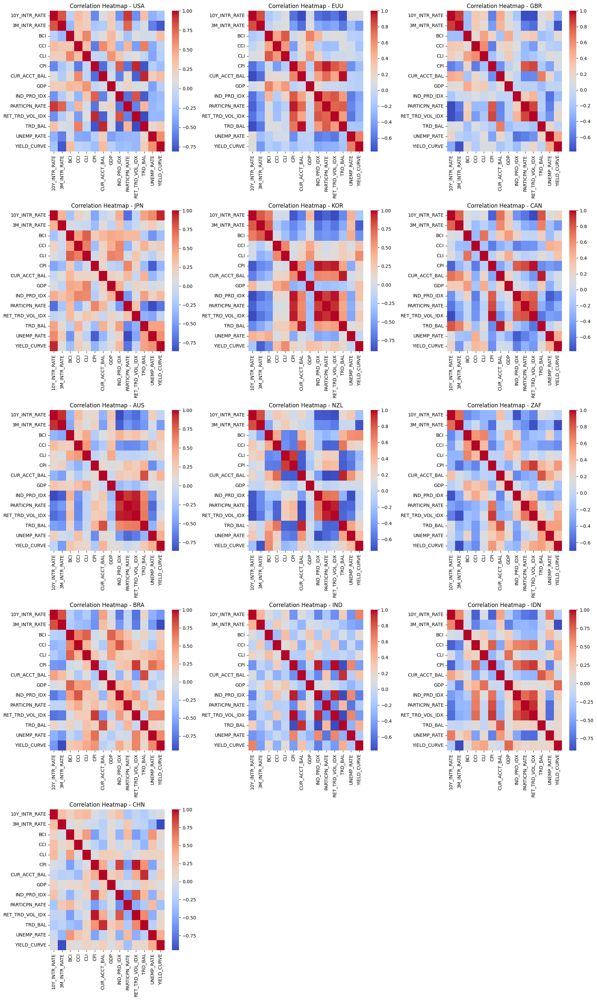

In [ ]:
regions = list(macroeconomic_df.keys())
n = len(regions)
rows = (n + 2) // 3  # 3 plots per row
fig, axes = plt.subplots(rows, 3, figsize=(18, 6 * rows))

for i, region in enumerate(regions):
    row, col = divmod(i, 3)
    ax = axes[row, col]

    # Filter out columns ending with '_MASK'
    df_filtered = macroeconomic_df[region].loc[:, ~macroeconomic_df[region].columns.str.endswith("_MASK")]
    corr = df_filtered.corr()

    sns.heatmap(corr, cmap='coolwarm', annot=False, ax=ax)
    ax.set_title(f"Correlation Heatmap - {region}")

# Hide unused subplots
for j in range(i + 1, rows * 3):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

#### Seasonal Decomposition of Macro Variables

In [ ]:
def plot_full_seasonal_decomposition(region):
    df = macroeconomic_df.get(region)
    if df is None:
        print(f"Region {region} not found.")
        return

    # Filter out columns ending with '_MASK'
    df = df.loc[:, ~df.columns.str.endswith("_MASK")]

    features = df.columns
    n_features = len(features)
    ncols = 2
    nrows = (n_features + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows=nrows * 3, ncols=ncols, figsize=(22, 6 * nrows), sharex=False)
    axes = np.array(axes).reshape(nrows * 3, ncols)

    for idx, feature in enumerate(features):
        row_group = (idx // ncols) * 3
        col_idx = idx % ncols

        try:
            series = df[feature].dropna()

            # Ensure datetime index
            if not isinstance(series.index, pd.DatetimeIndex):
                series.index = pd.to_datetime(series.index)

            # Set frequency if not already set (monthly)
            series = series.asfreq('ME')

            # Perform decomposition
            result = seasonal_decompose(series, model='additive', period=12)

            # Trend
            trend = result.trend.dropna()
            axes[row_group, col_idx].plot(trend.index, trend.values, color='green')
            axes[row_group, col_idx].set_title(f"Trend: {feature}", fontsize=10)

            # Seasonal
            seasonal = result.seasonal.dropna()
            axes[row_group + 1, col_idx].plot(seasonal.index, seasonal.values, color='orange')
            axes[row_group + 1, col_idx].set_title(f"Seasonality: {feature}", fontsize=10)

            # Residual
            resid = result.resid.dropna()
            axes[row_group + 2, col_idx].plot(resid.index, resid.values, color='blue')
            axes[row_group + 2, col_idx].set_title(f"Residual: {feature}", fontsize=10)

        except Exception as e:
            print(f"Could not decompose {feature}: {e}")
            continue

    # Hide extra subplots
    total_slots = nrows * ncols
    if n_features < total_slots:
        for idx in range(n_features, total_slots):
            for row_offset in range(3):
                axes[(idx // ncols) * 3 + row_offset, idx % ncols].axis('off')

    plt.tight_layout()
    plt.show()

##### USA

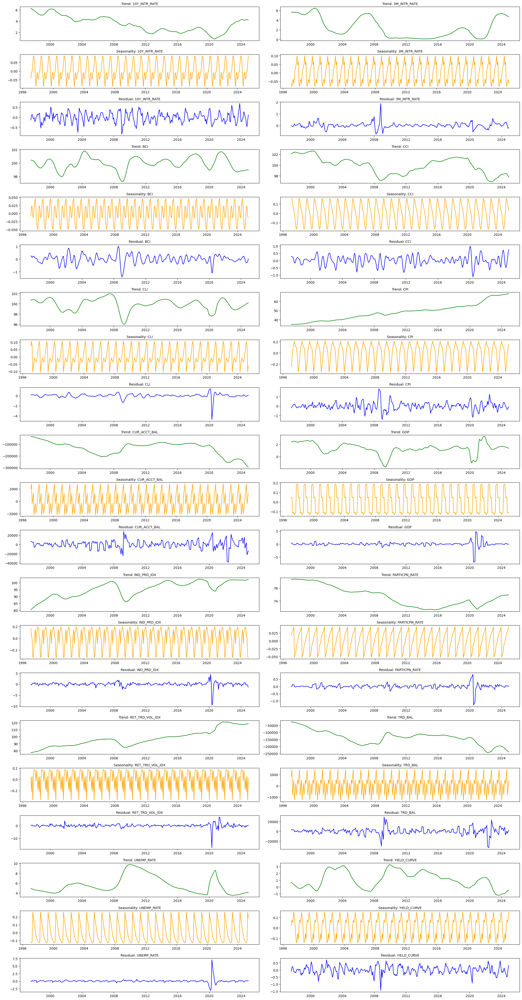

In [ ]:
plot_full_seasonal_decomposition("USA")

##### EUU

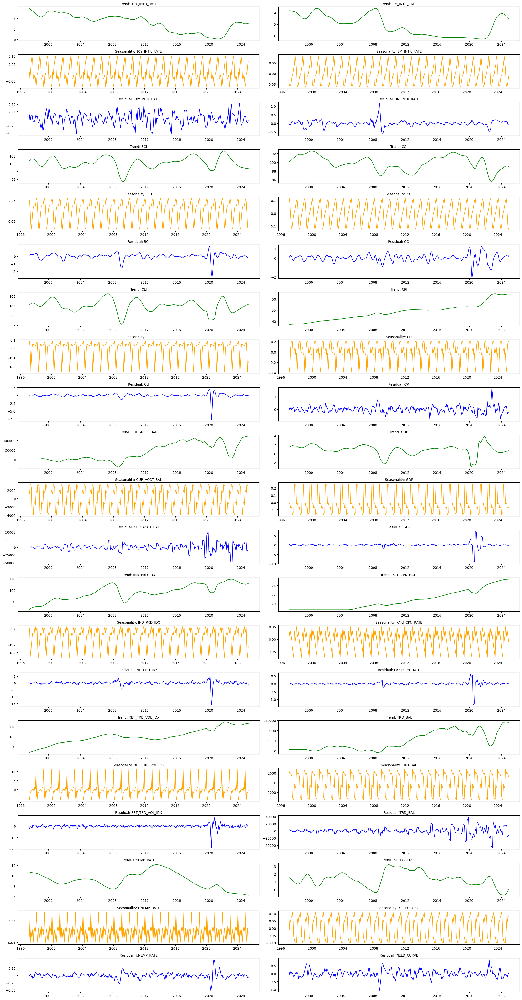

In [ ]:
plot_full_seasonal_decomposition("EUU")

##### CAN

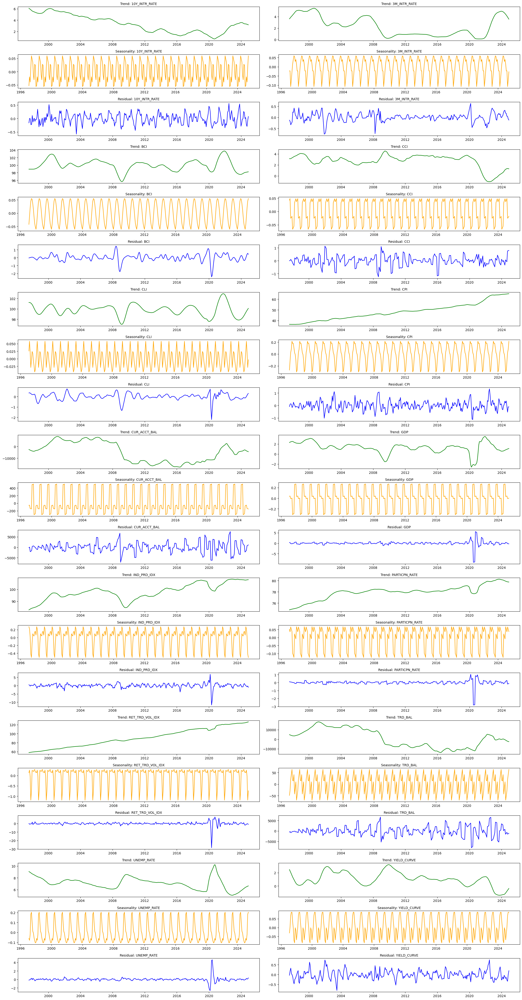

In [ ]:
plot_full_seasonal_decomposition("CAN")

##### GBR

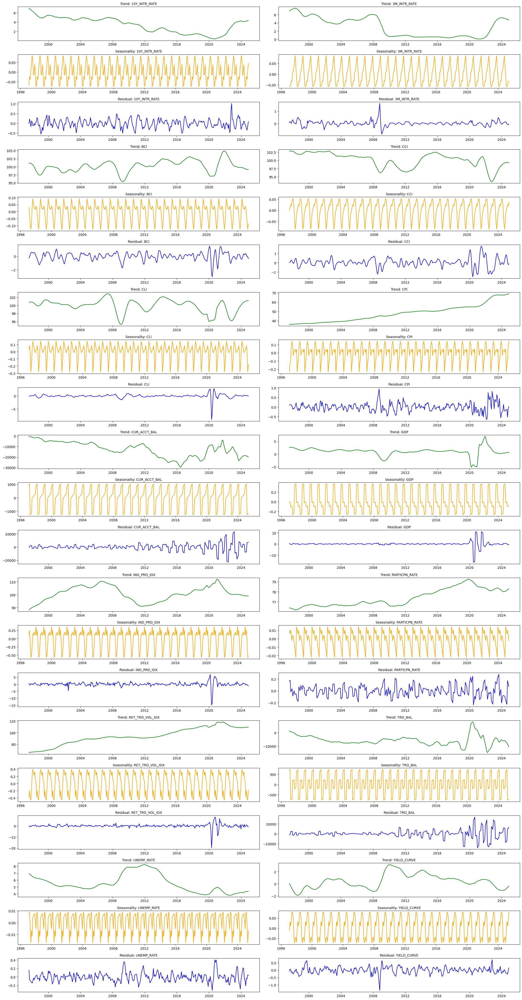

In [ ]:
plot_full_seasonal_decomposition("GBR")

##### CHN

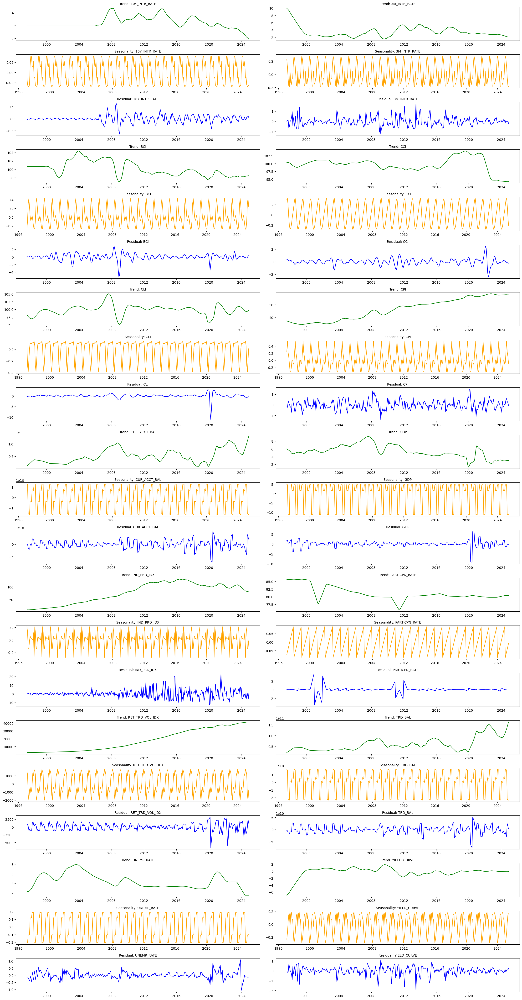

In [ ]:
plot_full_seasonal_decomposition("CHN")

##### JPN

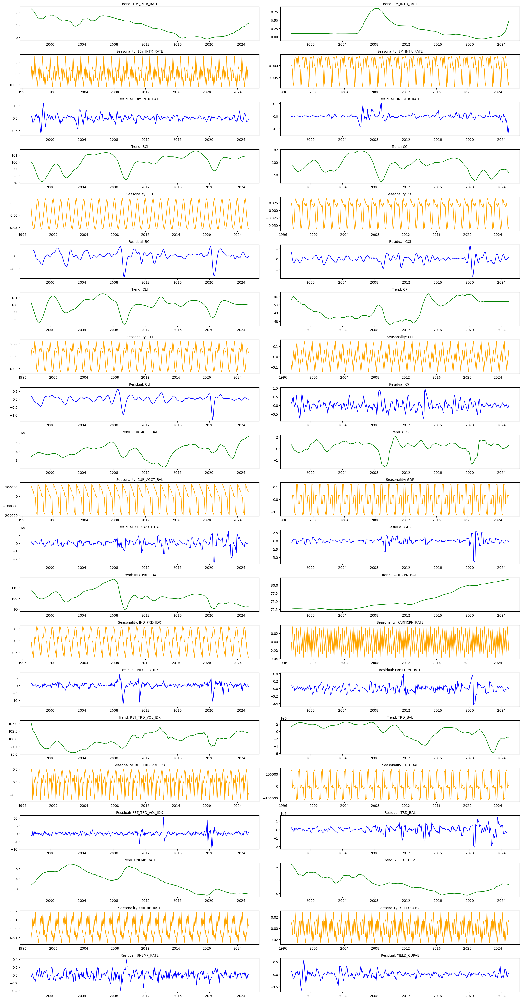

In [ ]:
plot_full_seasonal_decomposition("JPN")

##### IND

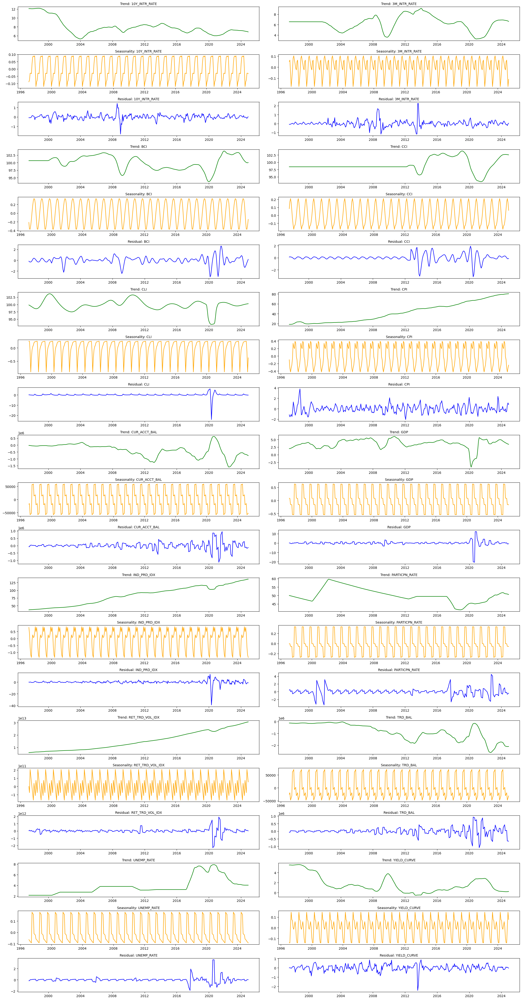

In [ ]:
plot_full_seasonal_decomposition("IND")

##### KOR

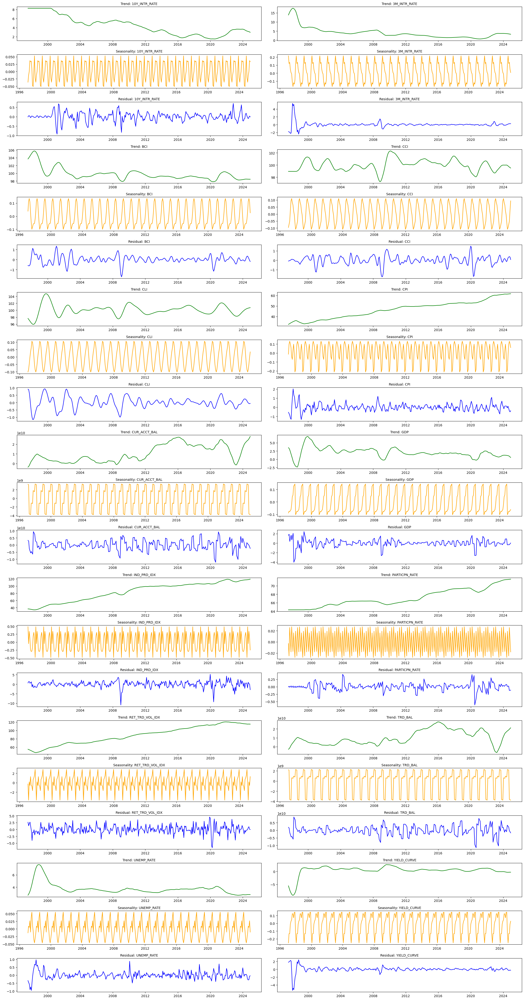

In [ ]:
plot_full_seasonal_decomposition("KOR")

##### IDN

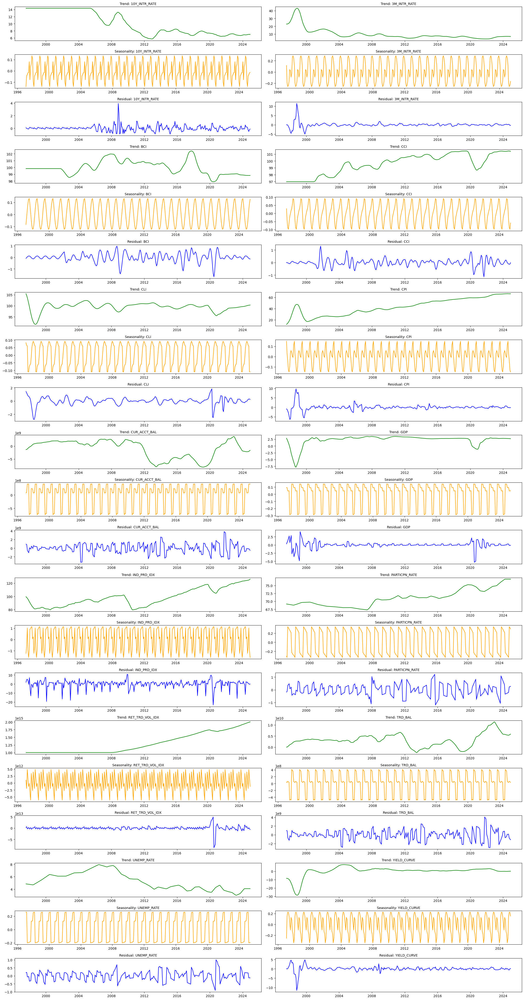

In [ ]:
plot_full_seasonal_decomposition("IDN")

##### ZAF

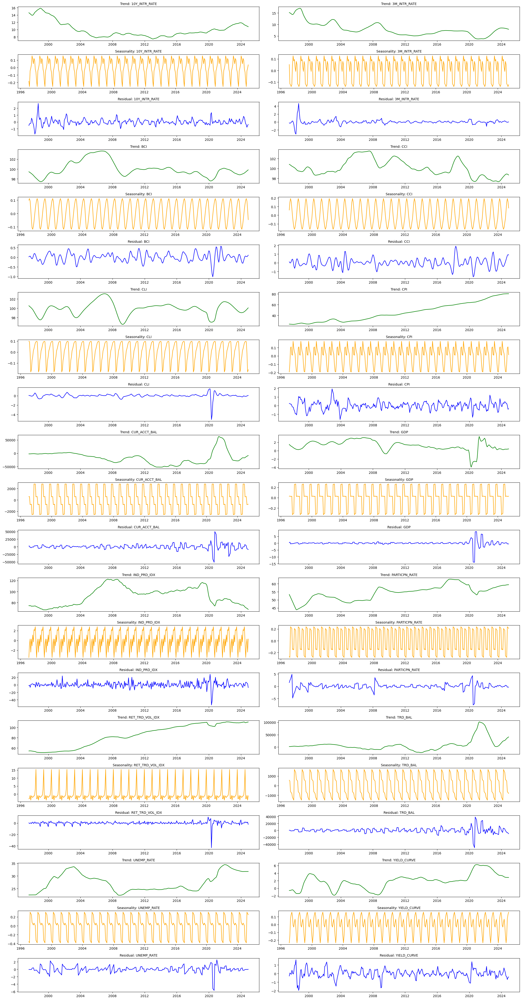

In [ ]:
plot_full_seasonal_decomposition("ZAF")

##### AUS

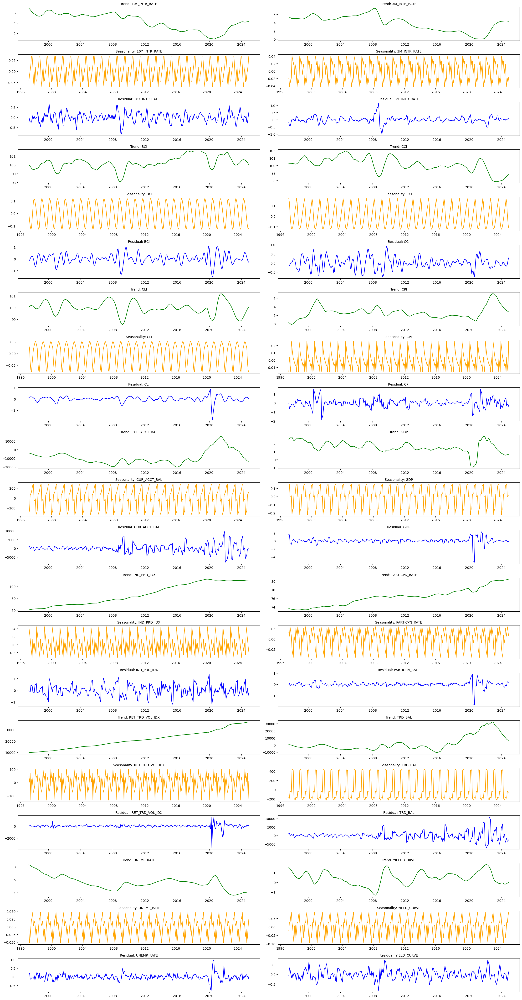

In [ ]:
plot_full_seasonal_decomposition("AUS")

##### NZL

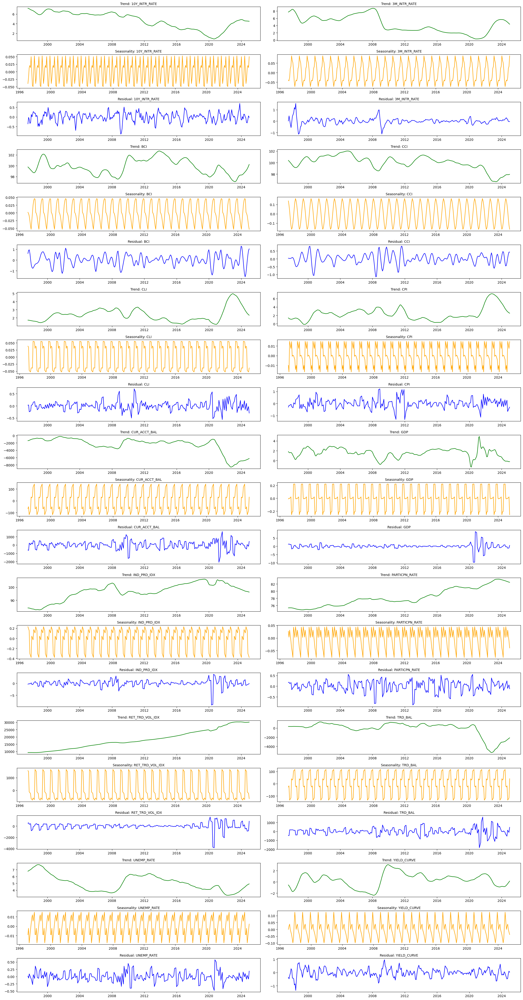

In [ ]:
plot_full_seasonal_decomposition("NZL")

##### BRA

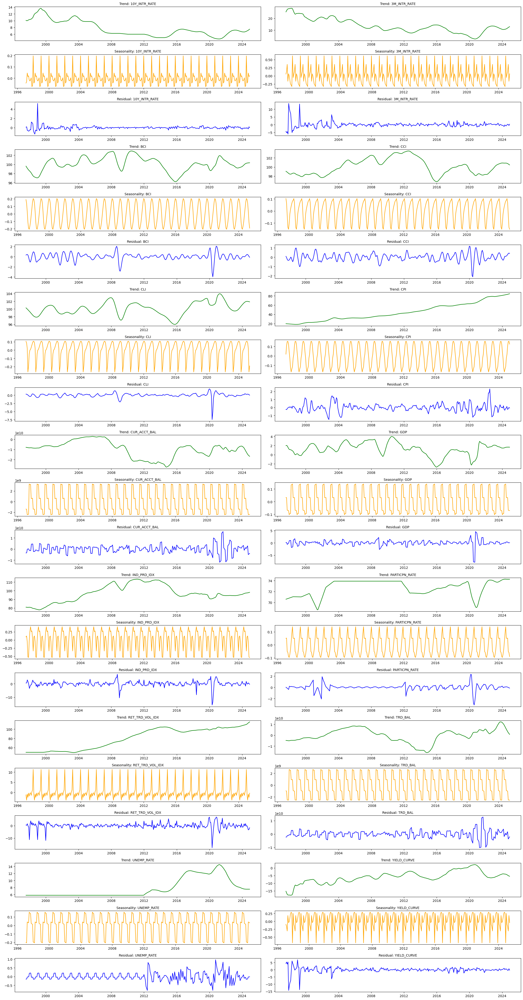

In [ ]:
plot_full_seasonal_decomposition("BRA")